In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.utils.class_weight import compute_class_weight

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    roc_auc_score, average_precision_score, log_loss,
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, RocCurveDisplay, PrecisionRecallDisplay
)


# to create a decision tree
from sklearn.tree import DecisionTreeClassifier


In [ ]:
df = pd.read_excel('/content/drive/MyDrive/flight_customer_data.xlsx')

In [ ]:
df.head()

,UserID,Taken_product,Yearly_avg_view_on_travel_page,preferred_device,total_likes_on_outstation_checkin_given,yearly_avg_Outstation_checkins,member_in_family,preferred_location_type,Yearly_avg_comment_on_travel_page,total_likes_on_outofstation_checkin_received,week_since_last_outstation_checkin,following_company_page,montly_avg_comment_on_company_page,working_flag,travelling_network_rating,Adult_flag,Daily_Avg_mins_spend_on_traveling_page
0,1000001,Yes,307.0,iOS and Android,38570.0,1,2,Financial,94.0,5993,8,Yes,11,No,1,0,8
1,1000002,No,367.0,iOS,9765.0,1,1,Financial,61.0,5130,1,No,23,Yes,4,1,10
2,1000003,Yes,277.0,iOS and Android,48055.0,1,2,Other,92.0,2090,6,Yes,15,No,2,0,7
3,1000004,No,247.0,iOS,48720.0,1,4,Financial,56.0,2909,1,Yes,11,No,3,0,8
4,1000005,No,202.0,iOS and Android,20685.0,1,1,Medical,40.0,3468,9,No,12,No,4,1,6


In [ ]:
df.shape

(11760, 17)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11760 entries, 0 to 11759
Data columns (total 17 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   UserID                                        11760 non-null  int64  
 1   Taken_product                                 11760 non-null  object 
 2   Yearly_avg_view_on_travel_page                11179 non-null  float64
 3   preferred_device                              11707 non-null  object 
 4   total_likes_on_outstation_checkin_given       11379 non-null  float64
 5   yearly_avg_Outstation_checkins                11685 non-null  object 
 6   member_in_family                              11760 non-null  object 
 7   preferred_location_type                       11729 non-null  object 
 8   Yearly_avg_comment_on_travel_page             11554 non-null  float64
 9   total_likes_on_outofstation_checkin_received  11760 non-null 

In [ ]:
df.columns = df.columns.str.strip()
df.columns.tolist()

['UserID',
 'Taken_product',
 'Yearly_avg_view_on_travel_page',
 'preferred_device',
 'total_likes_on_outstation_checkin_given',
 'yearly_avg_Outstation_checkins',
 'member_in_family',
 'preferred_location_type',
 'Yearly_avg_comment_on_travel_page',
 'total_likes_on_outofstation_checkin_received',
 'week_since_last_outstation_checkin',
 'following_company_page',
 'montly_avg_comment_on_company_page',
 'working_flag',
 'travelling_network_rating',
 'Adult_flag',
 'Daily_Avg_mins_spend_on_traveling_page']

In [ ]:
df.dtypes

,0
UserID,int64
Taken_product,object
Yearly_avg_view_on_travel_page,float64
preferred_device,object
total_likes_on_outstation_checkin_given,float64
yearly_avg_Outstation_checkins,object
member_in_family,object
preferred_location_type,object
Yearly_avg_comment_on_travel_page,float64
total_likes_on_outofstation_checkin_received,int64


In [ ]:
df.isnull().sum()

,0
UserID,0
Taken_product,0
Yearly_avg_view_on_travel_page,581
preferred_device,53
total_likes_on_outstation_checkin_given,381
yearly_avg_Outstation_checkins,75
member_in_family,0
preferred_location_type,31
Yearly_avg_comment_on_travel_page,206
total_likes_on_outofstation_checkin_received,0


In [ ]:
df.duplicated().sum()

np.int64(0)

In [ ]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
UserID,11760.0,NaN,NaN,NaN,1005880.5,3394.963917,1000001.0,1002940.75,1005880.5,1008820.25,1011760.0
Taken_product,11760,2,No,9864,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Yearly_avg_view_on_travel_page,11179.0,NaN,NaN,NaN,280.830844,68.182958,35.0,232.0,271.0,324.0,464.0
preferred_device,11707,10,Tab,4172,NaN,NaN,NaN,NaN,NaN,NaN,NaN
total_likes_on_outstation_checkin_given,11379.0,NaN,NaN,NaN,28170.481765,14385.032134,3570.0,16380.0,28076.0,40525.0,252430.0
yearly_avg_Outstation_checkins,11685.0,30.0,1.0,4543.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
member_in_family,11760.0,7.0,3.0,4561.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
preferred_location_type,11729,15,Beach,2424,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Yearly_avg_comment_on_travel_page,11554.0,NaN,NaN,NaN,74.790029,24.02665,3.0,57.0,75.0,92.0,815.0
total_likes_on_outofstation_checkin_received,11760.0,NaN,NaN,NaN,6531.699065,4706.613785,1009.0,2940.75,4948.0,8393.25,20065.0


In [ ]:
print("Full duplicate rows:", df.duplicated().sum())
if "UserID" in df.columns:
    print("Duplicate UserID count:", df["UserID"].duplicated().sum())

Full duplicate rows: 0
Duplicate UserID count: 0


Univariate Analysis (ALL variables, comprehensive)

In [ ]:
# ---------- UNIVARIATE HELPERS ----------
def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=40, log_if_skew=True):
    """
    Boxplot (top) + Histogram (bottom). Optional log1p histogram if skewed & non-negative.
    """
    x = data[feature].dropna()
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2, sharex=True, gridspec_kw={"height_ratios": (0.25, 0.75)}, figsize=figsize
    )
    sns.boxplot(data=data, x=feature, ax=ax_box2, showmeans=True, color="violet")
    sns.histplot(data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins)
    ax_hist2.axvline(x.mean(), color="green", linestyle="--", label="mean")
    ax_hist2.axvline(x.median(), color="black", linestyle="-", label="median")
    ax_hist2.legend()
    plt.suptitle(f"{feature} — histogram & boxplot", y=1.02)
    plt.show()

    if log_if_skew and (x >= 0).all() and x.skew() > 1.0:
        plt.figure(figsize=(12, 4))
        sns.histplot(np.log1p(x), kde=True, bins=bins)
        plt.title(f"{feature} — log1p histogram (skew={x.skew():.2f})")
        plt.xlabel(f"log1p({feature})")
        plt.show()


def labeled_barplot(data, feature, perc=False, n=None, order_by="count"):
    """
    Barplot with labels on bars.
    - perc: show % labels (based on non-null rows for this feature)
    - n: show top n categories (by count or by mean target if order_by='target')
    - order_by: 'count' or 'target' (requires Buy_ticket)
    """
    s = data[feature].fillna("NA")
    if order_by == "target" and "Buy_ticket" in data.columns:
        order = data.groupby(s)["Buy_ticket"].mean().sort_values(ascending=False).index
    else:
        order = s.value_counts().index
    if n: order = order[:n]

    plt.figure(figsize=(max(7, min(16, len(order)*0.6)), 4.8))
    ax = sns.countplot(x=s, order=order, palette="Paired")
    plt.xticks(rotation=90)
    plt.ylabel("count")
    plt.title(f"{feature} — count by category")

    total = s.shape[0]
    for p in ax.patches:
        val = p.get_height()
        label = f"{100*val/total:.1f}%" if perc else f"{val}"
        ax.annotate(label, (p.get_x()+p.get_width()/2, val),
                    ha="center", va="center", xytext=(0, 6), textcoords="offset points")
    plt.show()

Bivariate analysis

In [ ]:
# ---------- BIVARIATE HELPERS ----------
def num_vs_target_all(df, num_col, target="Buy_ticket"):
    """numeric vs binary target: box, violin, kde-by-class, decile mean target."""
    # Box
    plt.figure(figsize=(9, 4))
    sns.boxplot(data=df, x=target, y=num_col)
    plt.title(f"{num_col} vs {target} — Box")
    plt.show()

    # Violin
    plt.figure(figsize=(9, 4))
    sns.violinplot(data=df, x=target, y=num_col, cut=0, inner="quart")
    plt.title(f"{num_col} vs {target} — Violin")
    plt.show()

    # KDE by class (if mostly non-negative)
    sub = df[[target, num_col]].dropna()
    if (sub[num_col] >= 0).mean() > 0.95:
        plt.figure(figsize=(9, 4))
        for cls, g in sub.groupby(target):
            sns.kdeplot(g[num_col], label=f"{target}={cls}", linewidth=2)
        plt.title(f"{num_col} by {target} — KDE")
        plt.legend()
        plt.show()

    # Decile mean target
    try:
        dec = pd.qcut(df[num_col], 10, duplicates="drop")
        tmp = df.groupby(dec)[target].mean().reset_index()
        plt.figure(figsize=(9, 4))
        sns.lineplot(data=tmp, x=tmp.index, y=target, marker="o")
        plt.title(f"Mean {target} by deciles of {num_col}")
        plt.xlabel("Decile index (low → high)")
        plt.ylabel(f"Mean {target}")
        plt.show()
    except Exception:
        pass


def cat_vs_target_all(df, cat_col, target="Buy_ticket", top_n=20):
    """categorical vs binary target: mean target bar + stacked target distribution."""
    s = df[cat_col].fillna("NA")
    order = s.value_counts().index[:top_n]

    # Mean target by category
    tmp = df.assign(_cat=s).groupby("_cat")[target].mean().loc[order]
    plt.figure(figsize=(max(9, 0.5*len(order)), 4.8))
    sns.barplot(x=tmp.index, y=tmp.values)
    plt.title(f"Mean {target} by {cat_col} (top {top_n})")
    plt.ylabel(f"Mean {target}")
    plt.xlabel(cat_col)
    plt.xticks(rotation=45, ha="right")
    plt.show()

    # Stacked target distribution
    ctab = pd.crosstab(s, df[target])
    ctab = ctab.loc[order]
    ctab_norm = (ctab.T / ctab.sum(axis=1)).T
    ax = ctab_norm.plot(kind="bar", stacked=True, figsize=(max(9, 0.5*len(order)), 4.8))
    plt.title(f"{target} distribution by {cat_col} (top {top_n})")
    plt.ylabel("proportion")
    plt.xticks(rotation=45, ha="right")
    plt.legend(title=target, bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.show()


def num_vs_num_topcorr(df, num_cols, k=12, hue=None):
    """Top-|corr| numeric pairs: regplot (or lmplot w/ hue) + hexbin."""
    import itertools
    if len(num_cols) < 2:
        return
    corr = df[num_cols].corr().abs()
    pairs = []
    for i, j in itertools.combinations(num_cols, 2):
        val = corr.loc[i, j]
        if not np.isnan(val):
            pairs.append(((i, j), val))
    pairs = sorted(pairs, key=lambda x: x[1], reverse=True)[:k]

    for (x, y), c in pairs:
        # regplot
        plt.figure(figsize=(9, 4))
        sns.regplot(data=df, x=x, y=y, scatter_kws={"alpha":0.35, "s":12}, line_kws={"linewidth":2})
        plt.title(f"{x} vs {y} — regplot (|r|={c:.2f})")
        plt.show()

        # hexbin (dense)
        plt.figure(figsize=(9, 4))
        plt.hexbin(df[x], df[y], gridsize=40, mincnt=1)
        plt.title(f"{x} vs {y} — hexbin (|r|={c:.2f})")
        plt.xlabel(x); plt.ylabel(y)
        plt.show()


def num_vs_cat_all(df, num_cols, cat_col, top_n=12):
    """Every numeric vs one categorical: boxen + mean±CI for top_n levels."""
    s = df[cat_col].fillna("NA")
    order = s.value_counts().index[:top_n]
    sub = df.assign(_cat=s).loc[df.assign(_cat=s)["_cat"].isin(order)]

    for num in num_cols:
        plt.figure(figsize=(max(9, 0.5*len(order)), 4.9))
        sns.boxenplot(data=sub, x="_cat", y=num, order=order)
        plt.title(f"{num} by {cat_col} — boxen (top {top_n})")
        plt.xticks(rotation=45, ha="right")
        plt.show()

        plt.figure(figsize=(max(9, 0.5*len(order)), 4.9))
        sns.pointplot(data=sub, x="_cat", y=num, order=order, errorbar="ci")
        plt.title(f"{num} mean by {cat_col} — pointplot w/ 95% CI (top {top_n})")
        plt.xticks(rotation=45, ha="right")
        plt.show()


Multivariate Analysis

In [ ]:
# ---------- MULTIVARIATE HELPERS ----------
def corr_heatmaps(df, numeric_cols, methods=("pearson", "spearman")):
    for m in methods:
        corr = df[numeric_cols].corr(method=m)
        plt.figure(figsize=(10, 8))
        sns.heatmap(corr, annot=True, fmt=".2f", vmin=-1, vmax=1, cmap="Spectral")
        plt.title(f"Correlation heatmap ({m.title()})")
        plt.show()

def corr_with_target_bar(df, numeric_cols, target="Buy_ticket", method="spearman"):
    if target not in df.columns:
        return
    corr = df[numeric_cols + [target]].corr(method=method)[target].drop(target).sort_values(ascending=False)
    plt.figure(figsize=(6, max(4, 0.35*len(corr))))
    sns.barplot(x=corr.values, y=corr.index)
    plt.title(f"{method.title()} correlation with {target}")
    plt.xlabel("correlation"); plt.ylabel("")
    plt.show()

def pairwise_top_to_target(df, numeric_cols, target="Buy_ticket", top_k=6):
    if target not in df.columns:
        return
    sp = df[numeric_cols + [target]].corr(method="spearman")[target].drop(target)
    top = sp.abs().sort_values(ascending=False).head(top_k).index.tolist()
    cols = top + [target]
    try:
        g = sns.PairGrid(df[cols].dropna(), hue=target, corner=True, diag_sharey=False)
        g.map_lower(sns.scatterplot, s=12, alpha=0.5)
        g.map_diag(sns.kdeplot)
        g.add_legend()
        g.fig.suptitle("Pairwise (top to target)", y=1.02)
        plt.show()
    except Exception as e:
        print("PairGrid skipped:", e)

def device_sliced_correlations(df, numeric_cols, device_col="preferred_device"):
    if device_col not in df.columns:
        return
    for dev, part in df.groupby(device_col):
        if len(part) < 50:
            continue
        corr = part[numeric_cols].corr(method="spearman")
        plt.figure(figsize=(9, 7))
        sns.heatmap(corr, cmap="crest", center=0)
        plt.title(f"Spearman heatmap — {device_col}={dev}")
        plt.show()


Column detection & quick overview

In [ ]:
target = "Buy_ticket"
id_cols = ("UserID",)

num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = df.select_dtypes(exclude=[np.number]).columns.tolist()
num_cols = [c for c in num_cols if c != target]
cat_cols = [c for c in cat_cols if c not in id_cols]

print("Numeric:", num_cols)
print("Categorical:", cat_cols)

if target in df.columns:
    print("\nTarget value counts:")
    print(df[target].value_counts(dropna=False))
    print("Target rate:", df[target].mean())

# Optional: missingness & duplicates snapshot
missing = df.isna().sum().sort_values(ascending=False)
display(pd.DataFrame({"n_missing": missing, "pct_missing": (missing/len(df)).round(4)}))
print("Full duplicate rows:", df.duplicated().sum())
if "UserID" in df.columns:
    print("Duplicate UserID:", df["UserID"].duplicated().sum())


Numeric: ['UserID', 'Yearly_avg_view_on_travel_page', 'total_likes_on_outstation_checkin_given', 'Yearly_avg_comment_on_travel_page', 'total_likes_on_outofstation_checkin_received', 'week_since_last_outstation_checkin', 'montly_avg_comment_on_company_page', 'travelling_network_rating', 'Adult_flag', 'Daily_Avg_mins_spend_on_traveling_page']
Categorical: ['Taken_product', 'preferred_device', 'yearly_avg_Outstation_checkins', 'member_in_family', 'preferred_location_type', 'following_company_page', 'working_flag']


,n_missing,pct_missing
Yearly_avg_view_on_travel_page,581,0.0494
total_likes_on_outstation_checkin_given,381,0.0324
Yearly_avg_comment_on_travel_page,206,0.0175
following_company_page,103,0.0088
yearly_avg_Outstation_checkins,75,0.0064
preferred_device,53,0.0045
preferred_location_type,31,0.0026
UserID,0,0.0000
Taken_product,0,0.0000
member_in_family,0,0.0000


Full duplicate rows: 0
Duplicate UserID: 0


Numeric (hist+box; log view if skewed)

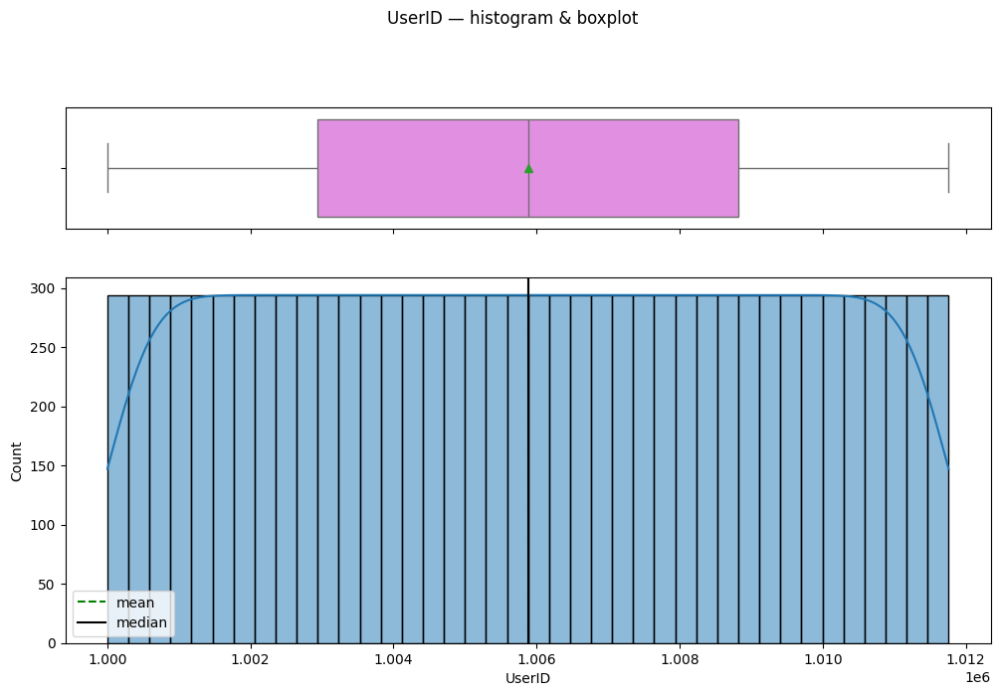

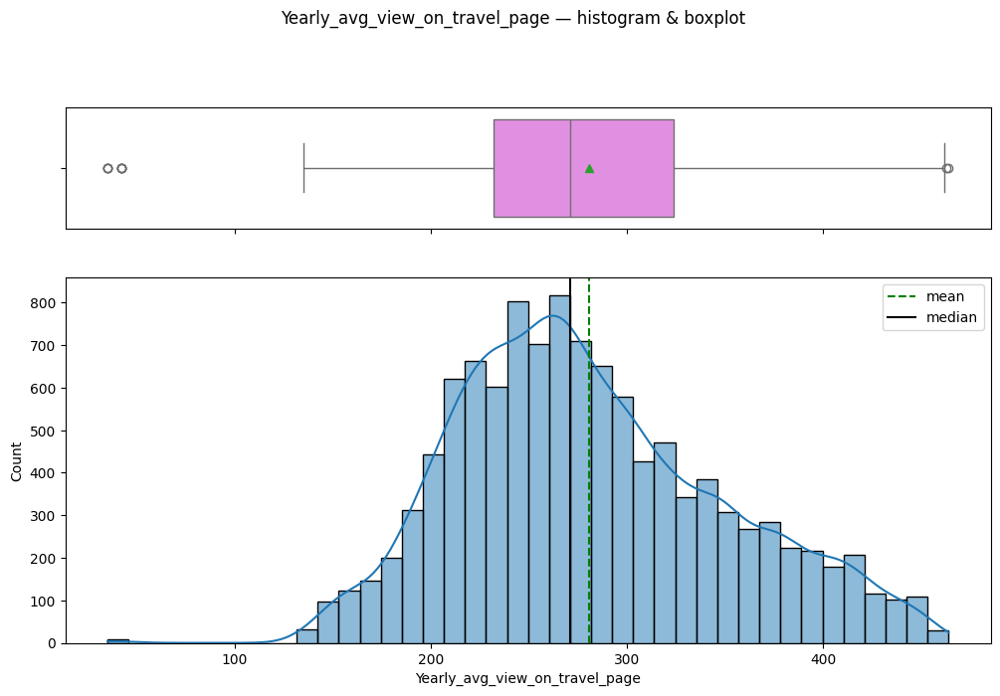

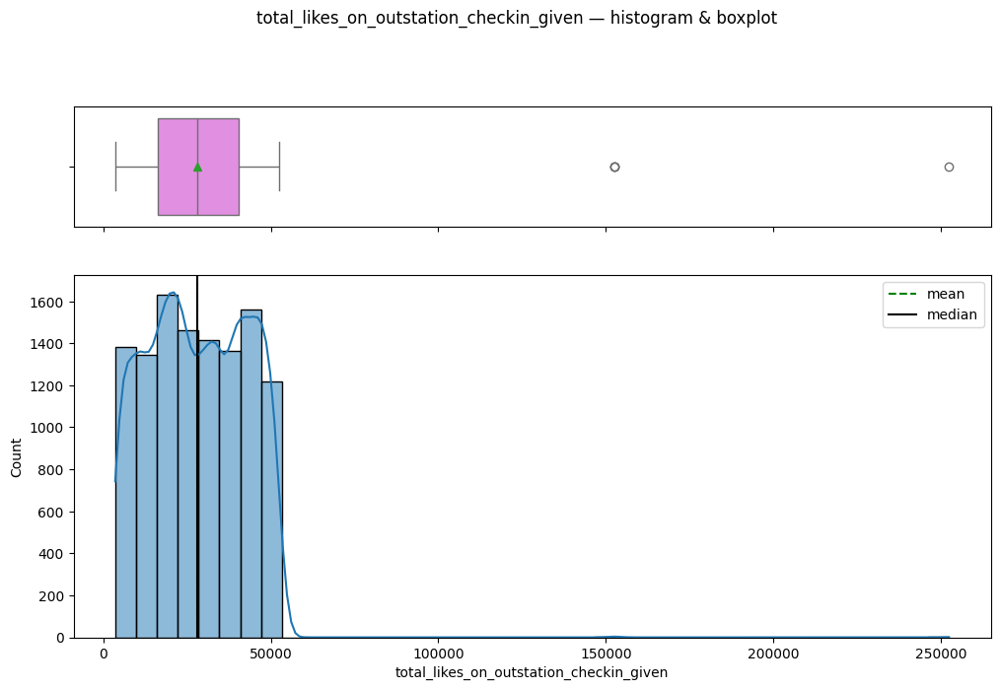

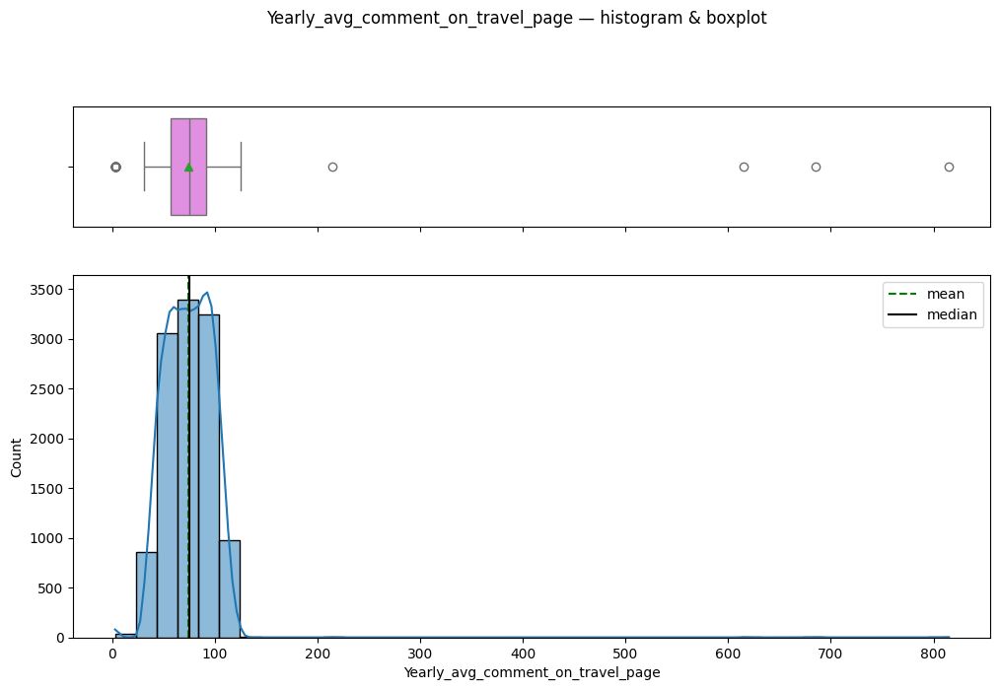

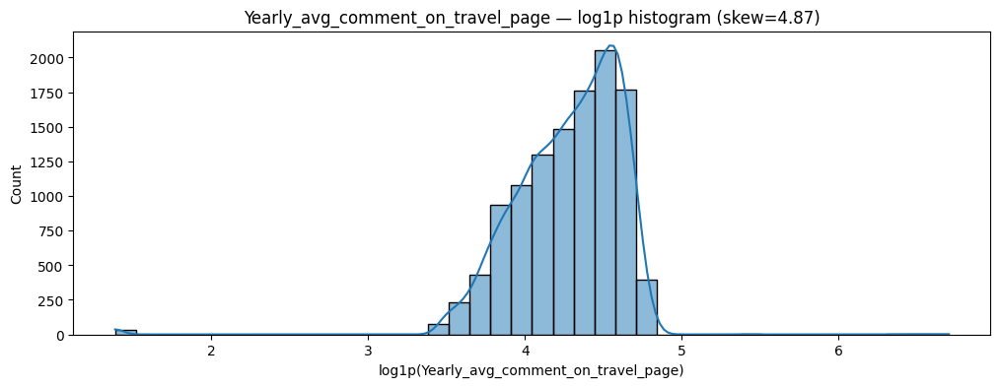

...

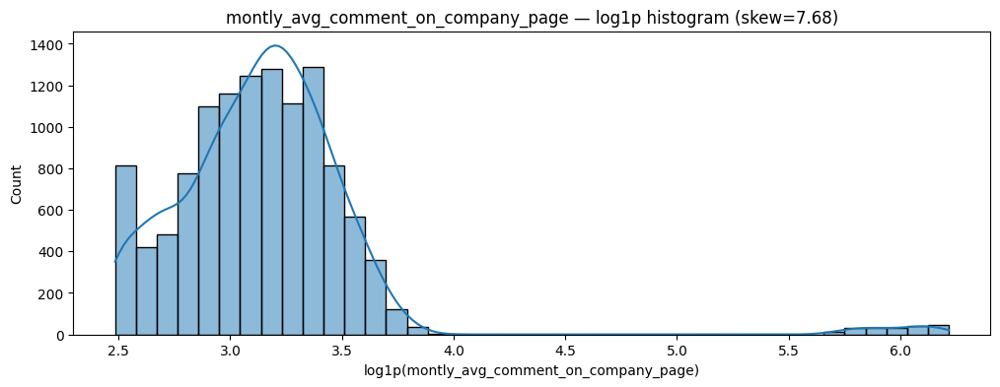

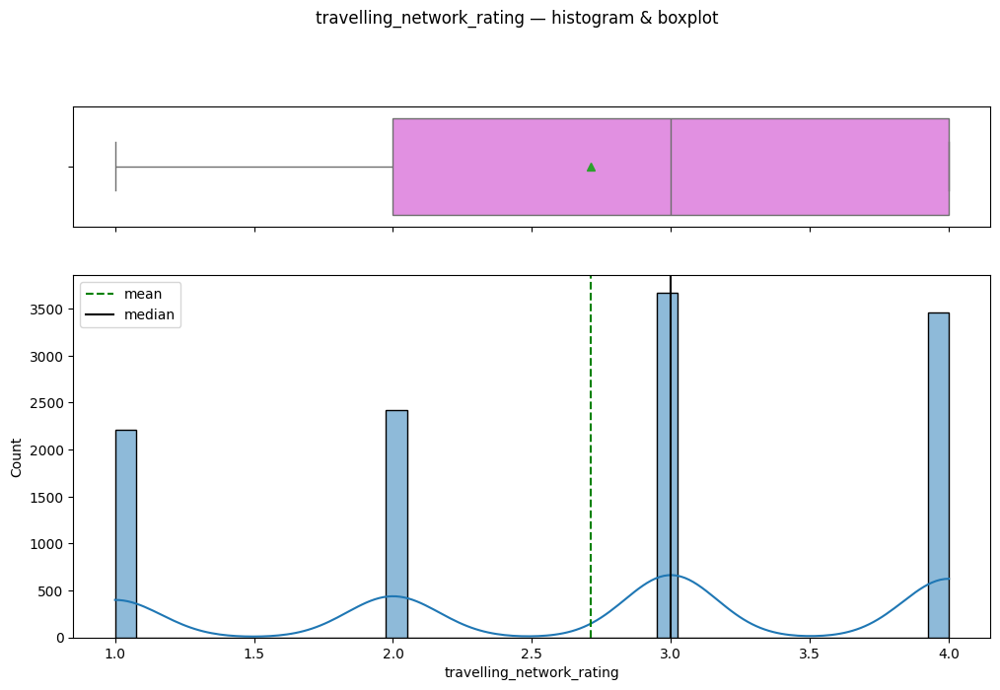

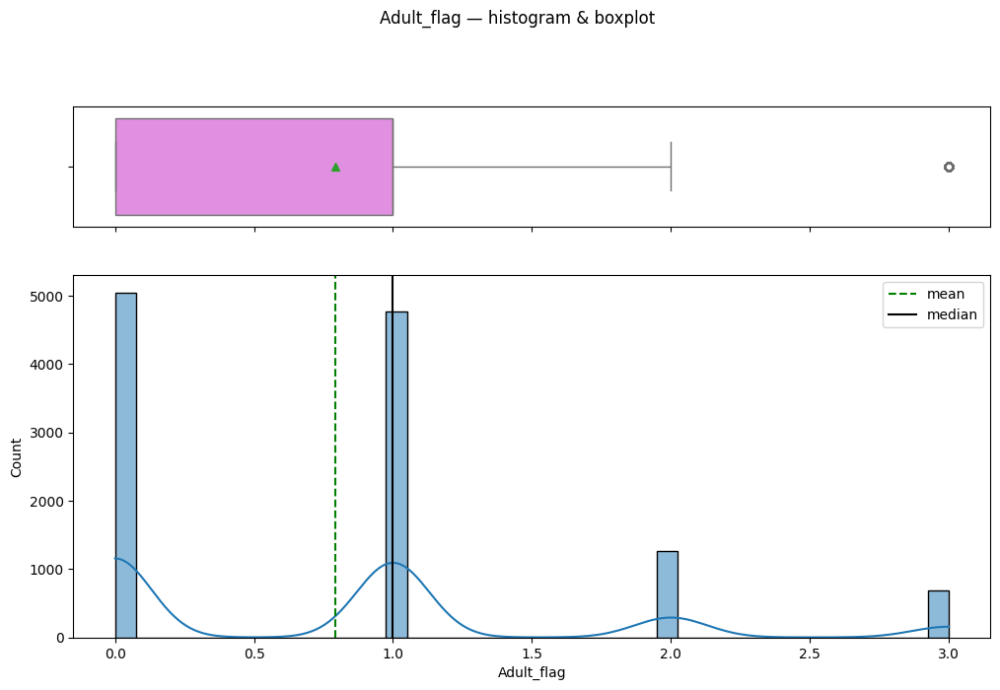

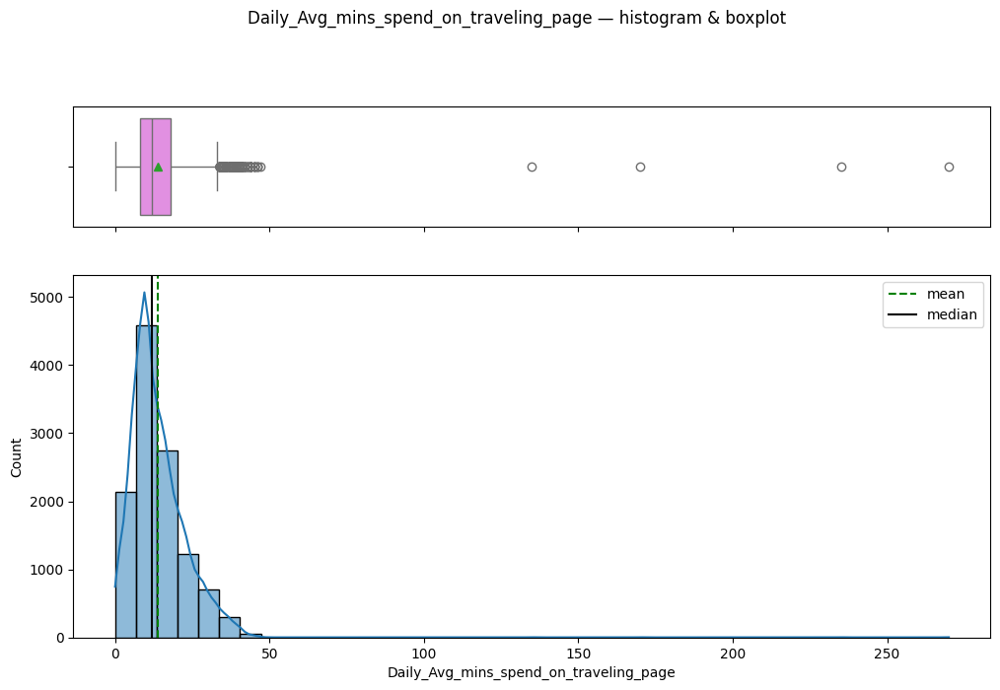

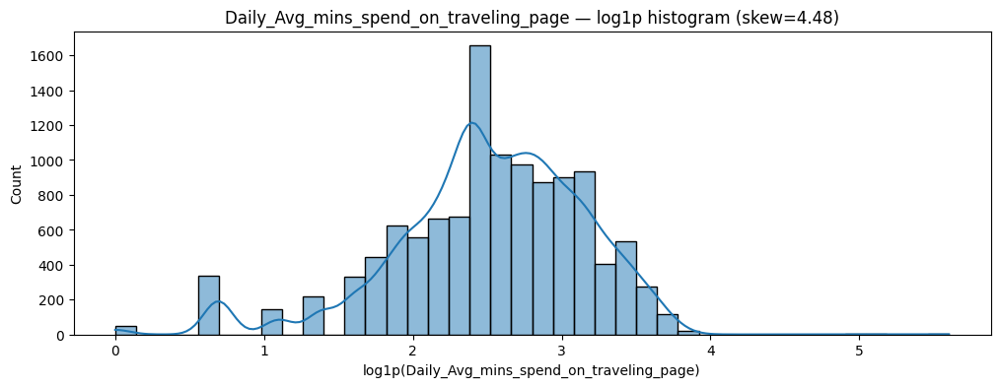

In [ ]:
for col in num_cols:
    histogram_boxplot(df, col, kde=True, bins=40, log_if_skew=True)


Categorical (labeled bars with %)

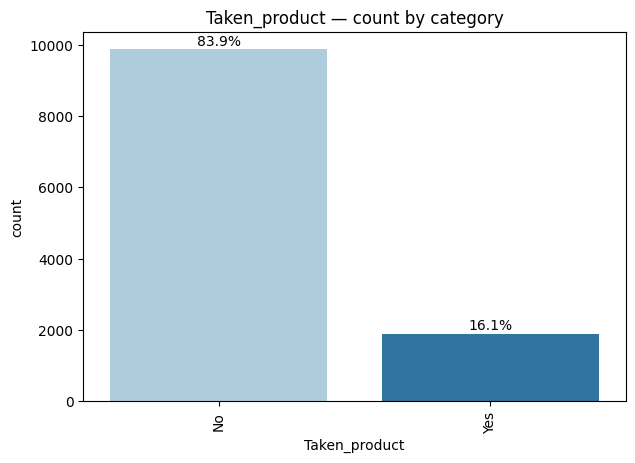

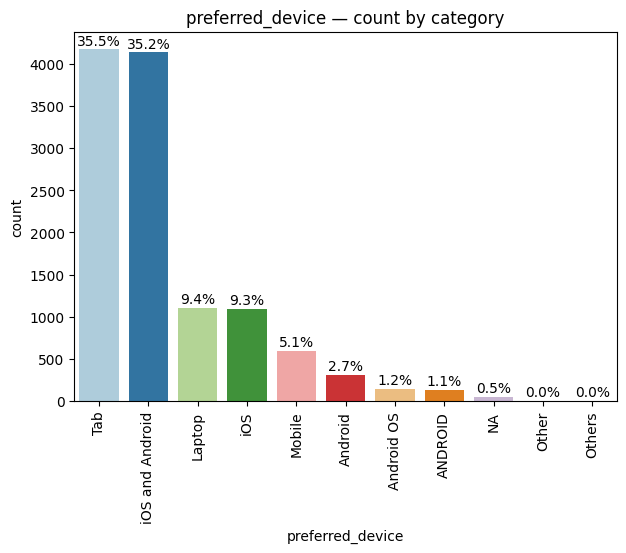

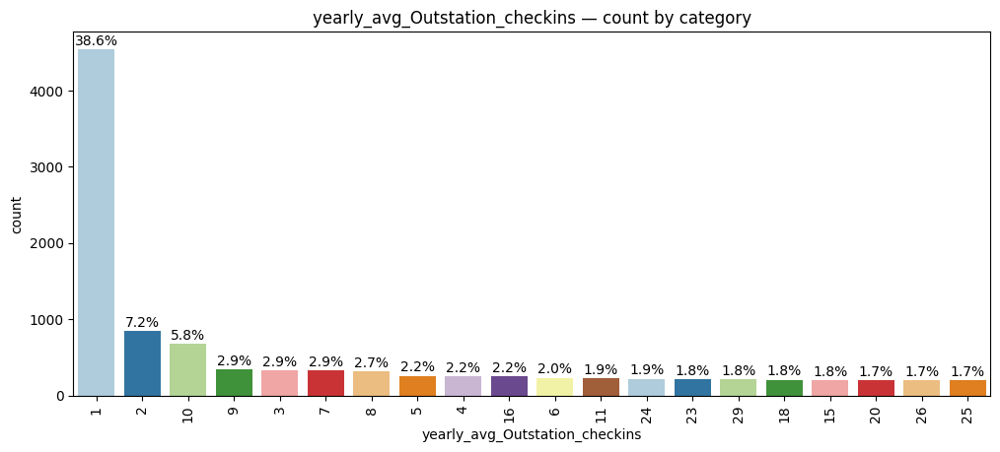

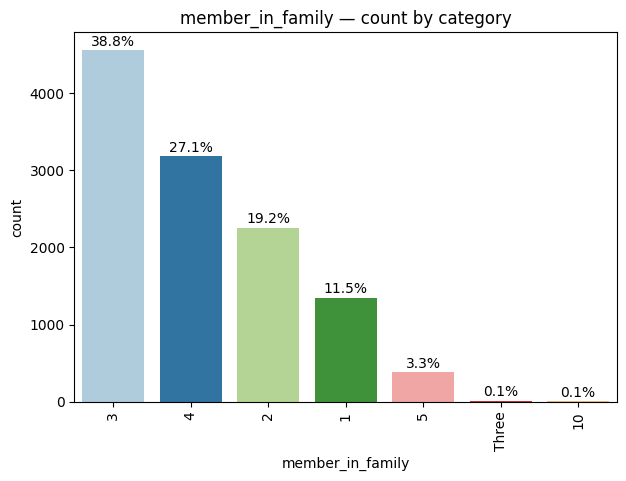

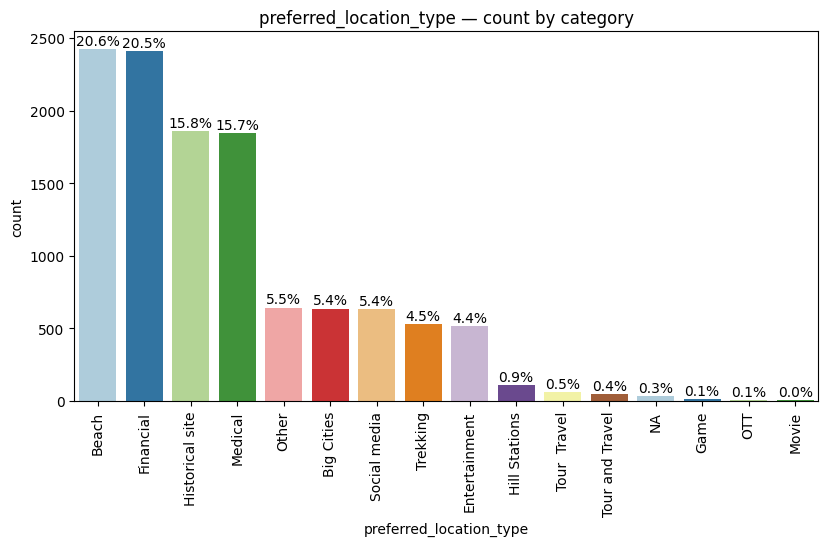

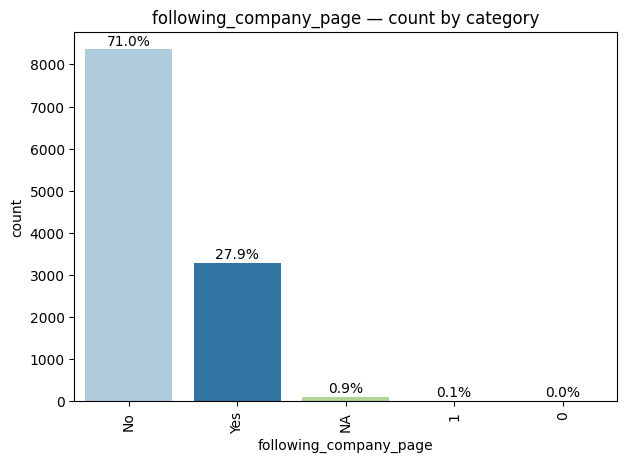

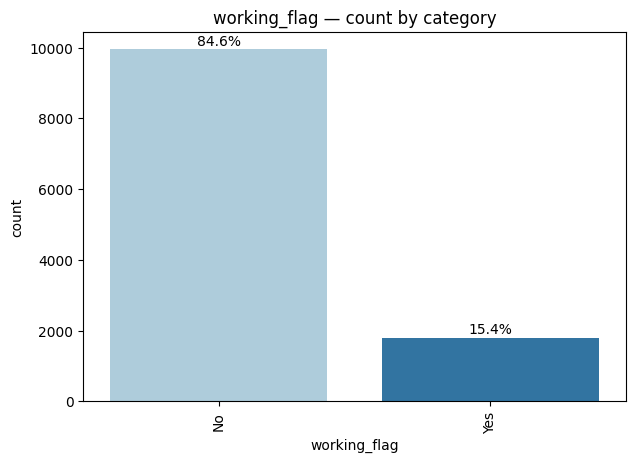

In [ ]:
for col in cat_cols:
    n_unique = df[col].nunique(dropna=True)
    top_n = 20 if n_unique > 20 else None
    labeled_barplot(df, col, perc=True, n=top_n, order_by="count")


Target distribution (quick)

In [ ]:
if target in df.columns:
    vc = df[target].value_counts()
    plt.figure(figsize=(6,4))
    sns.barplot(x=vc.index.astype(str), y=vc.values)
    plt.title(f"Target distribution: {target}")
    plt.xlabel(target); plt.ylabel("count")
    plt.show()


BIVARIATE (Numeric vs Target (box, violin, kde, deciles)

In [ ]:
if target in df.columns:
    for col in num_cols:
        num_vs_target_all(df, col, target=target)


In [ ]:
if target in df.columns:
    for col in cat_cols:
        cat_vs_target_all(df, col, target=target, top_n=20)


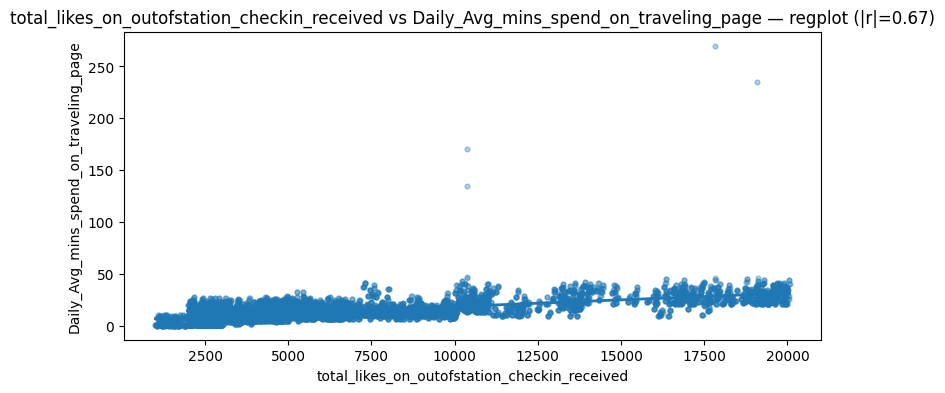

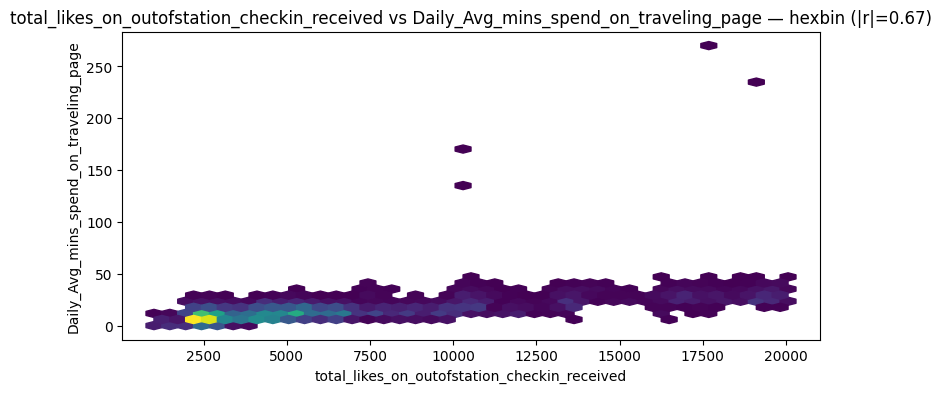

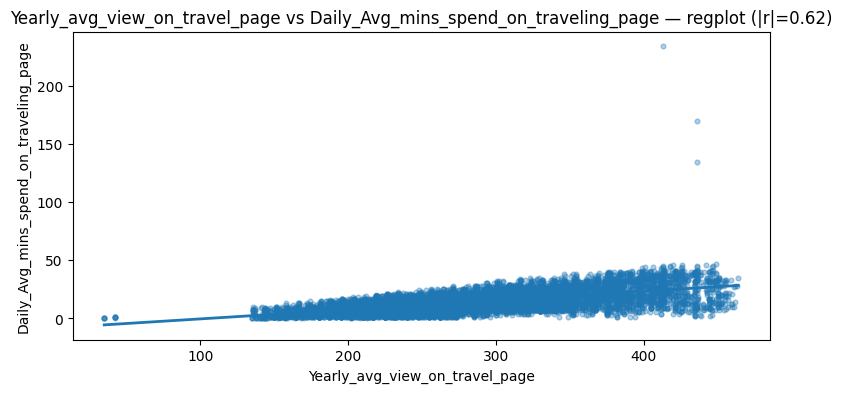

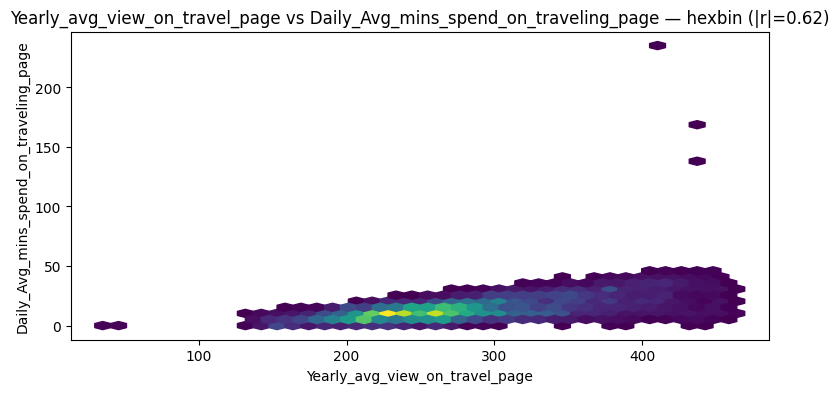

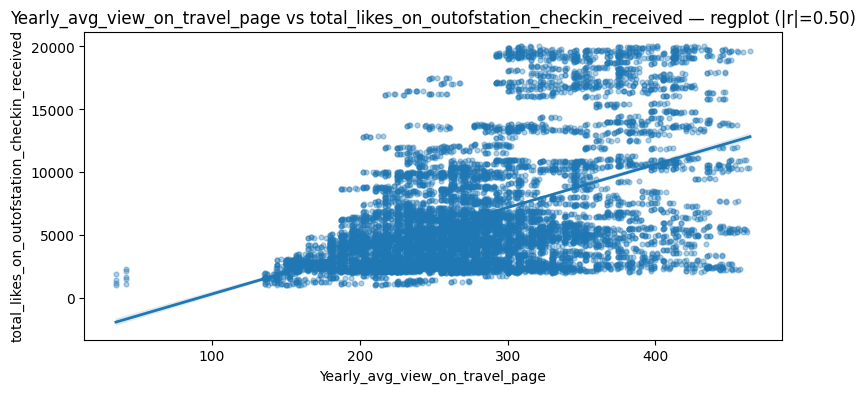

...

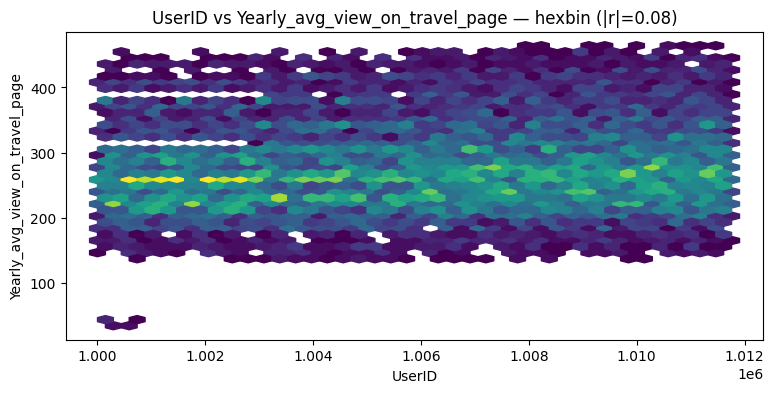

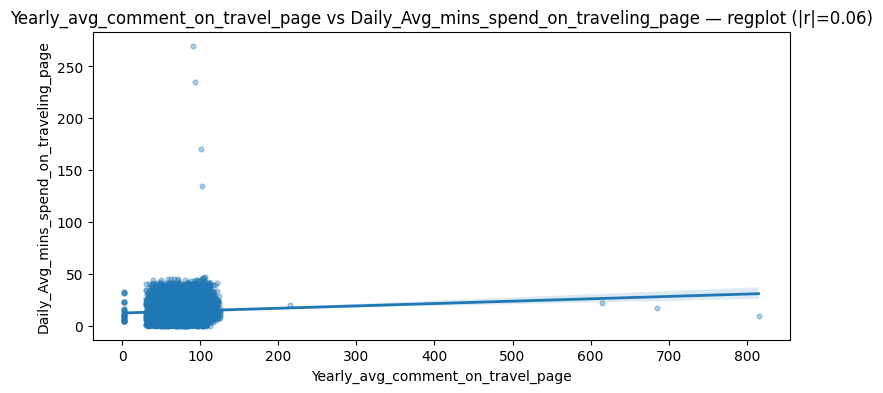

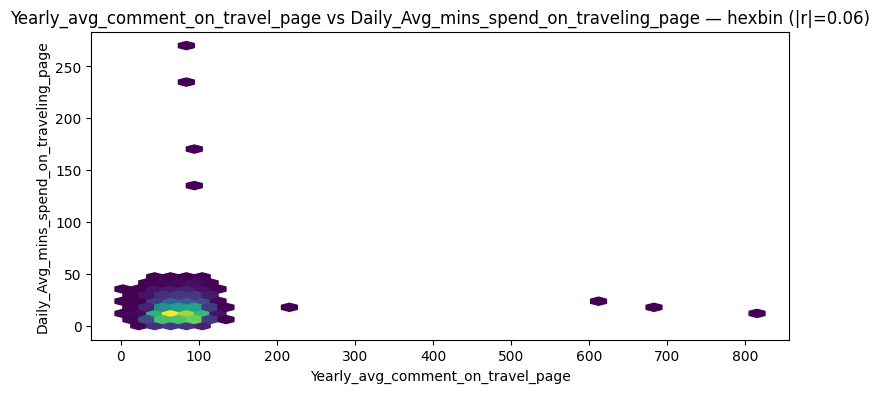

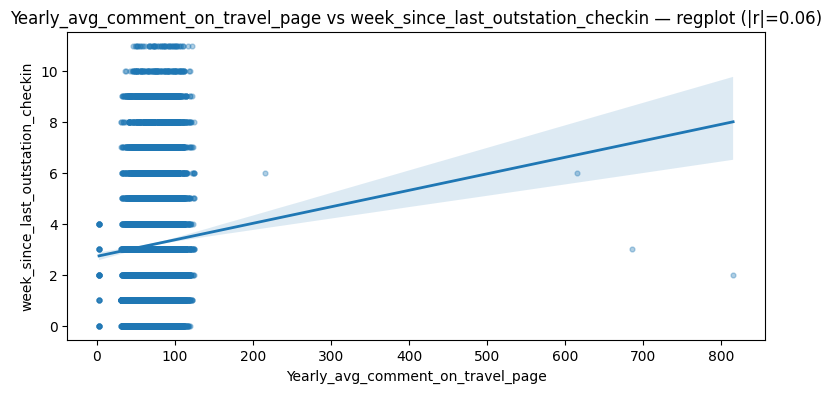

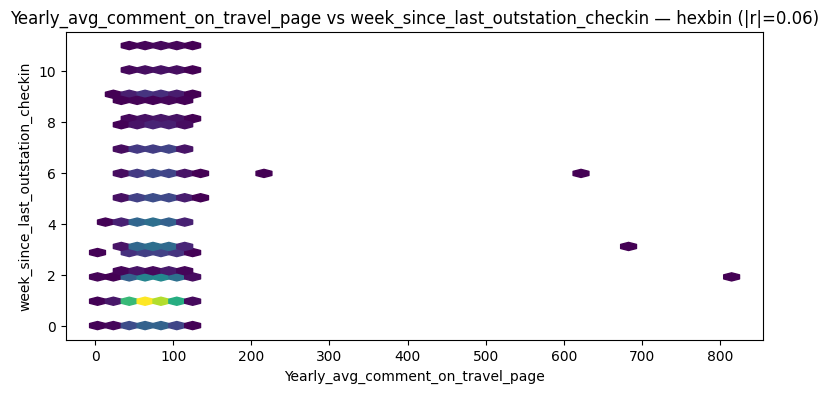

In [ ]:
num_vs_num_topcorr(df, num_cols, k=12, hue=None)


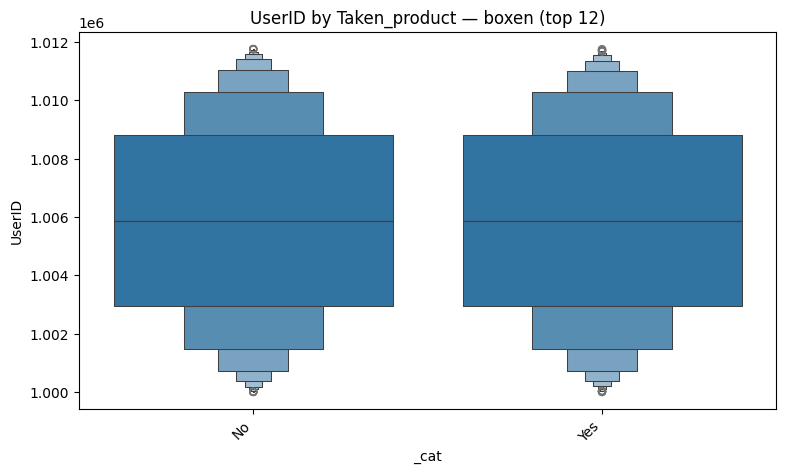

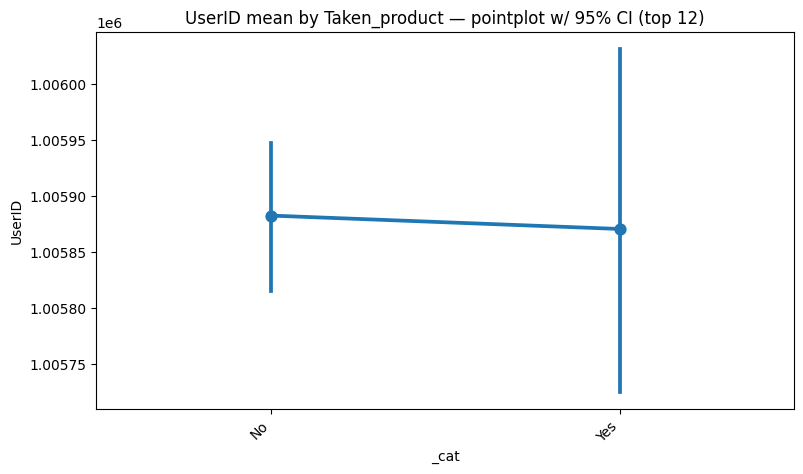

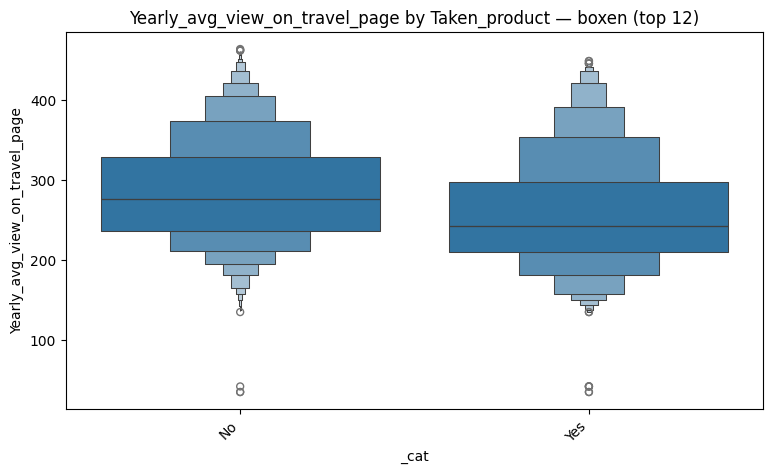

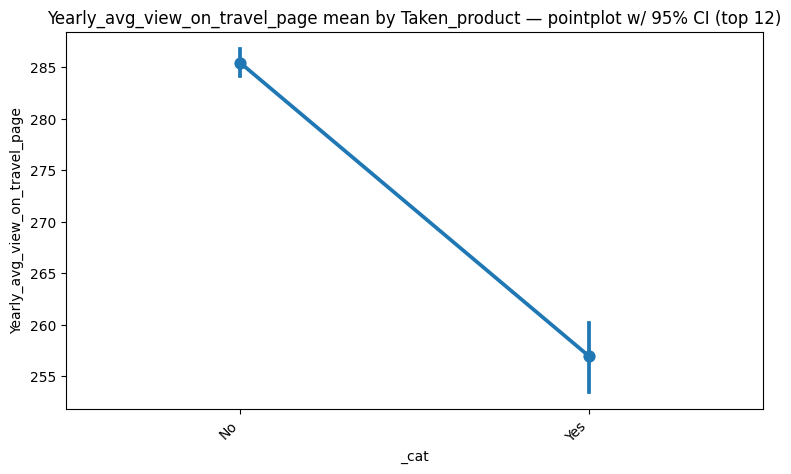

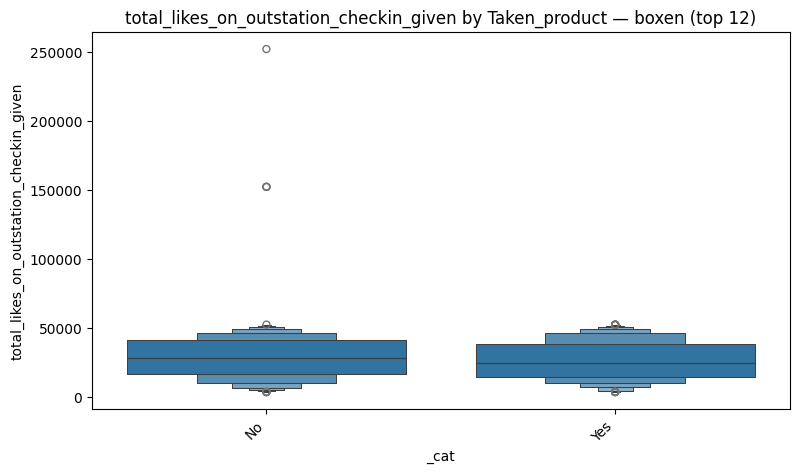

...

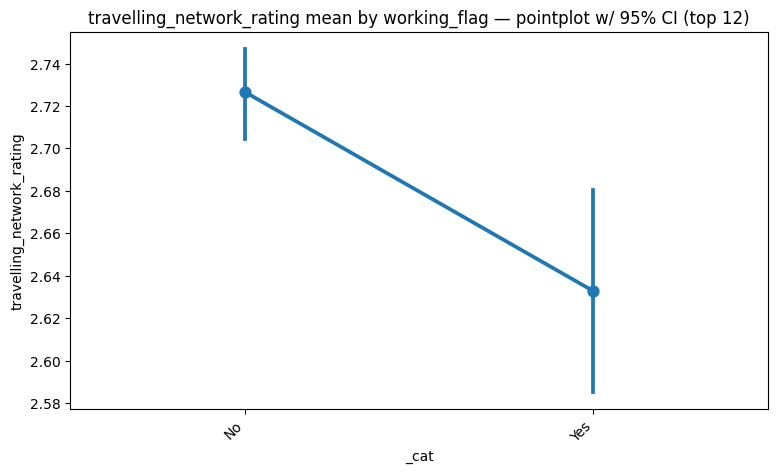

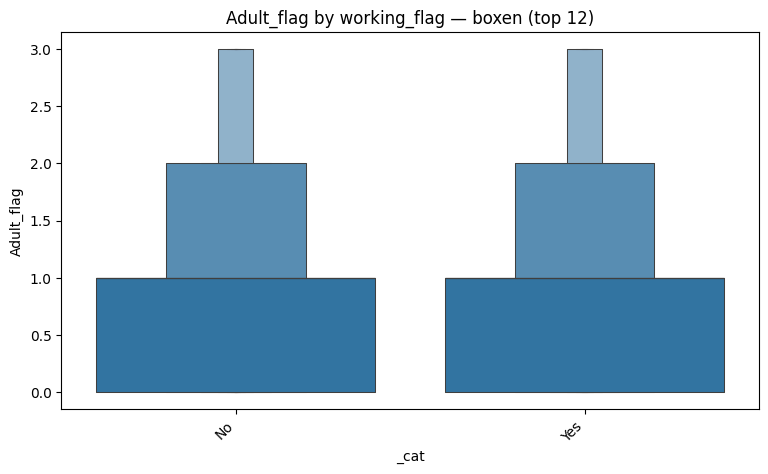

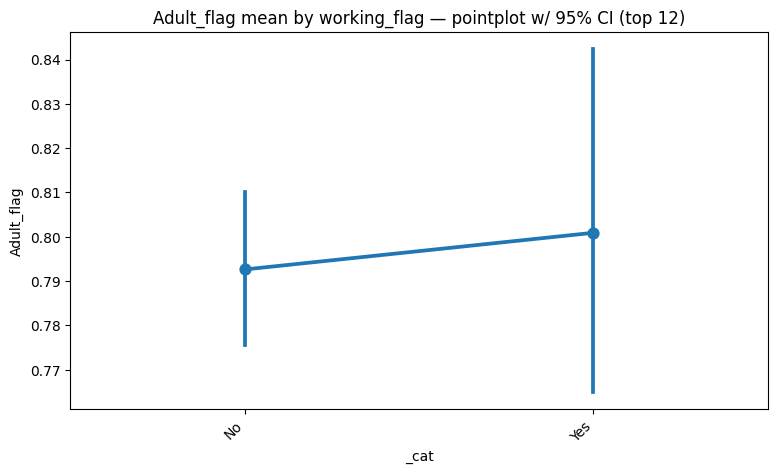

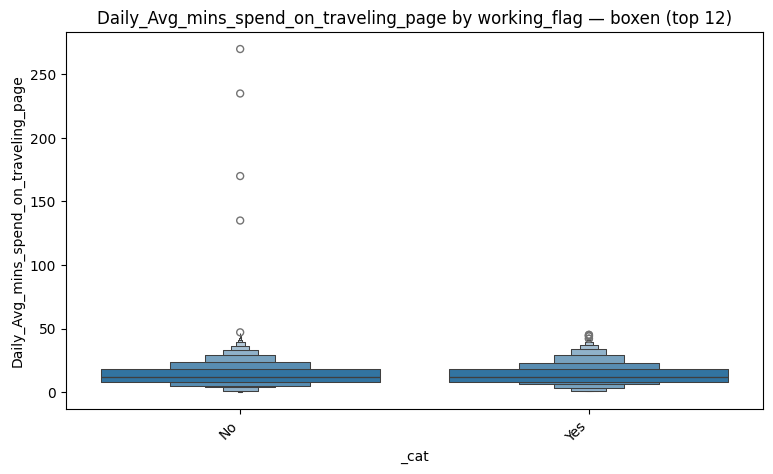

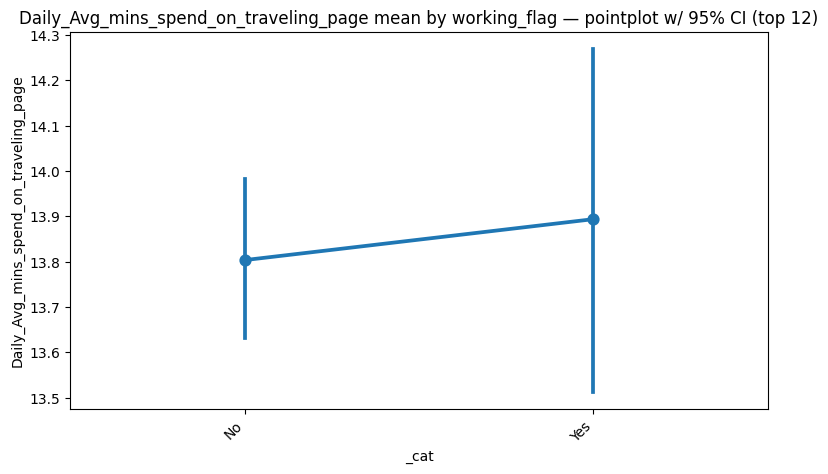

In [ ]:
for catc in cat_cols:
    num_vs_cat_all(df, num_cols, catc, top_n=12)


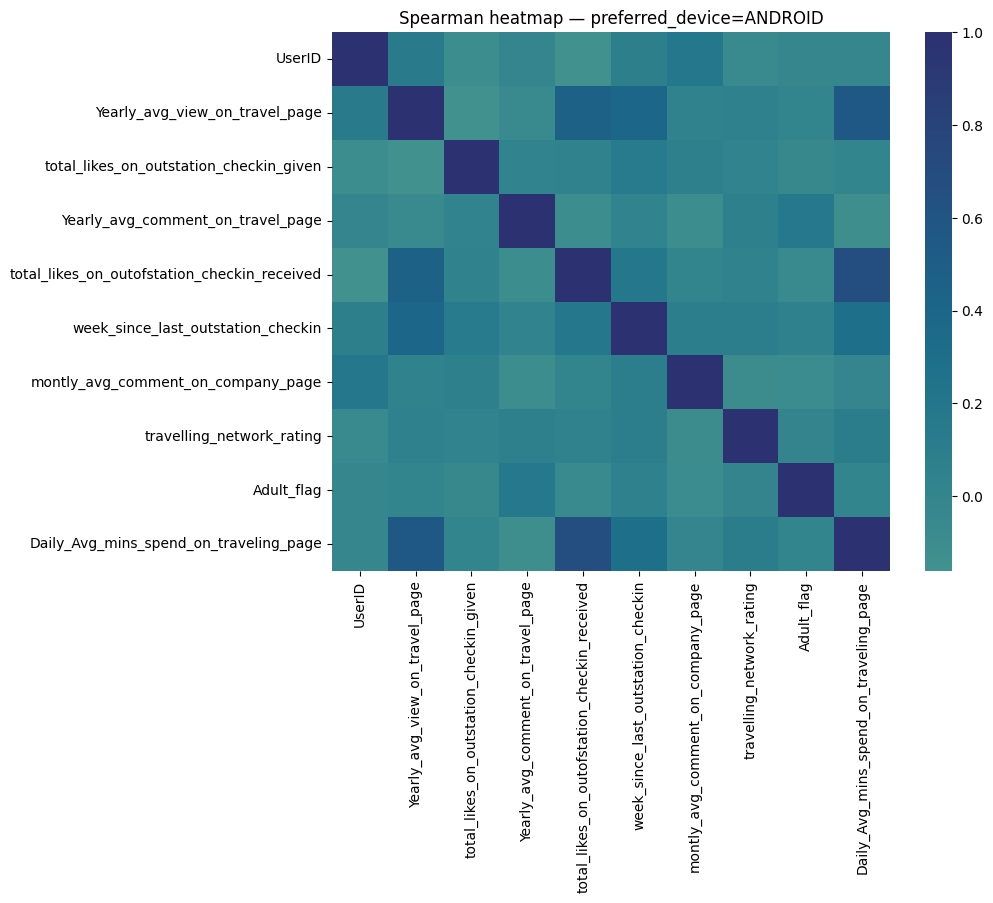

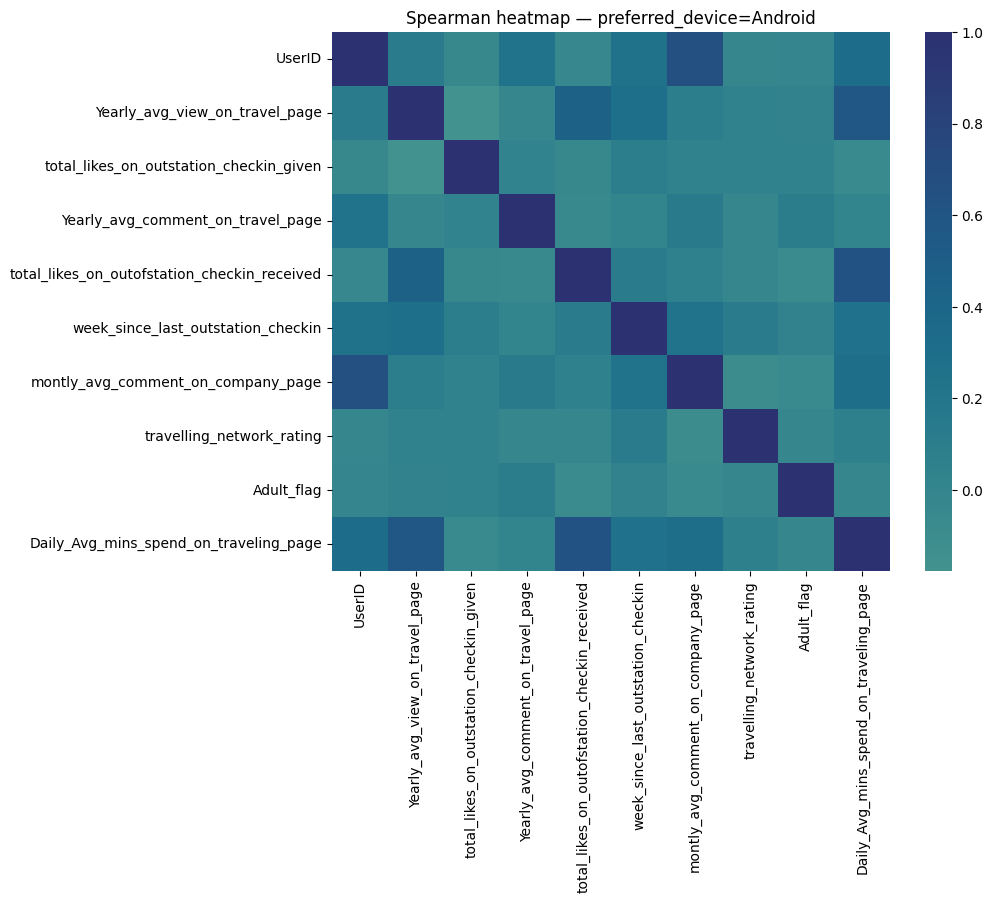

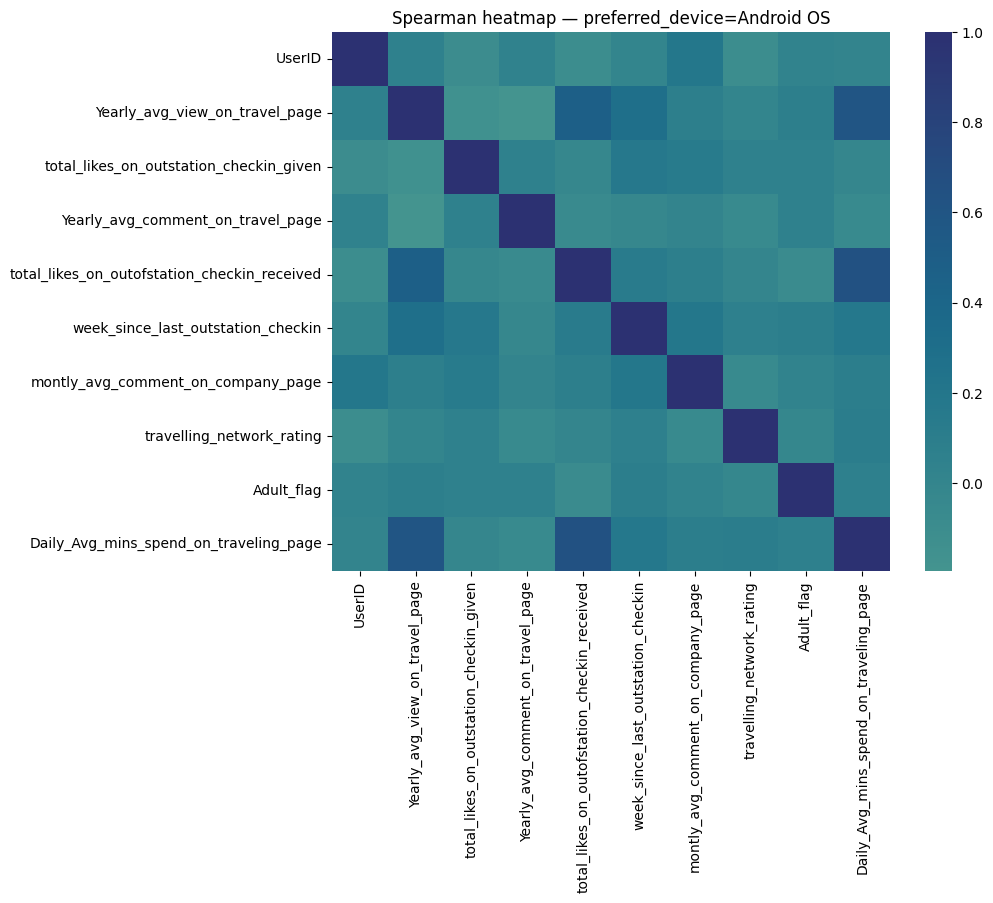

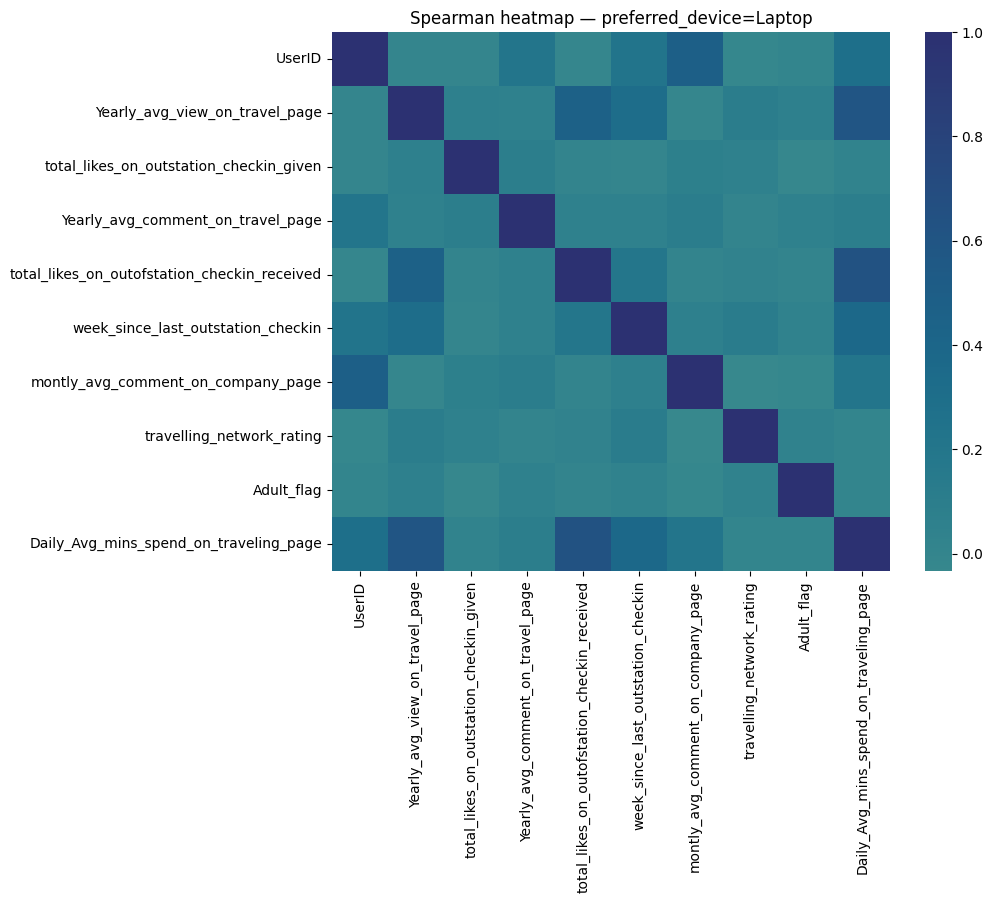

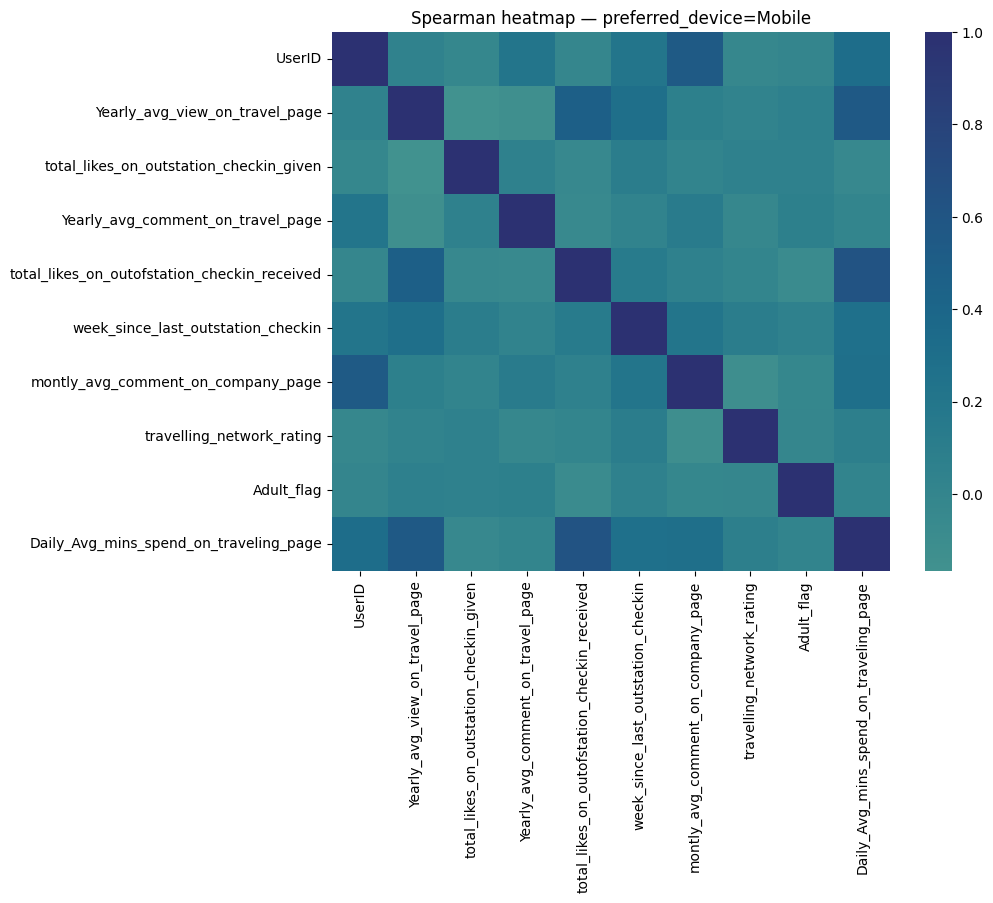

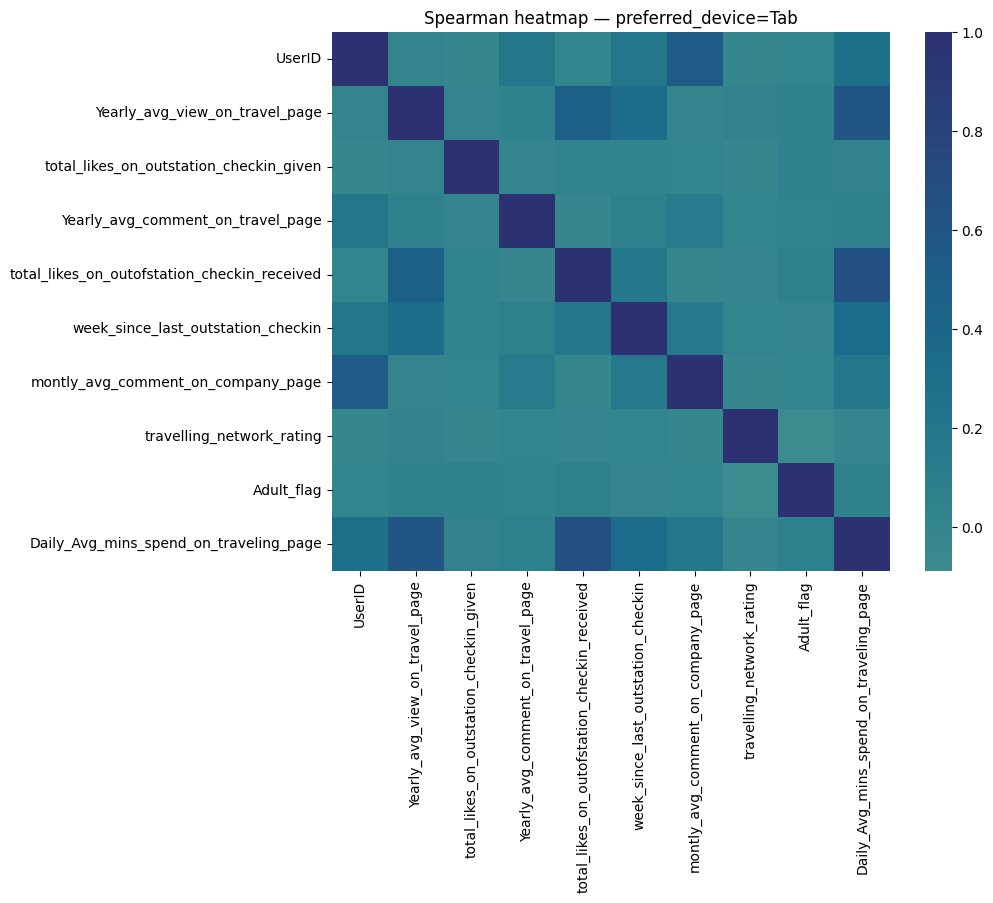

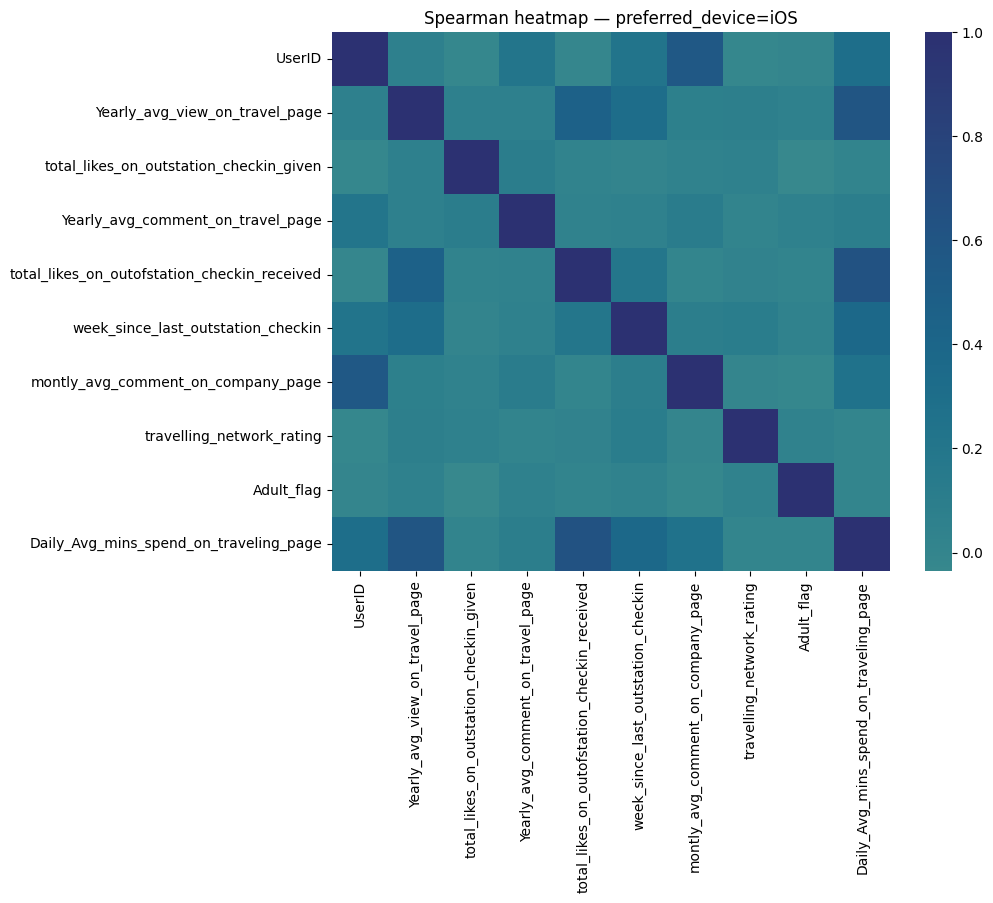

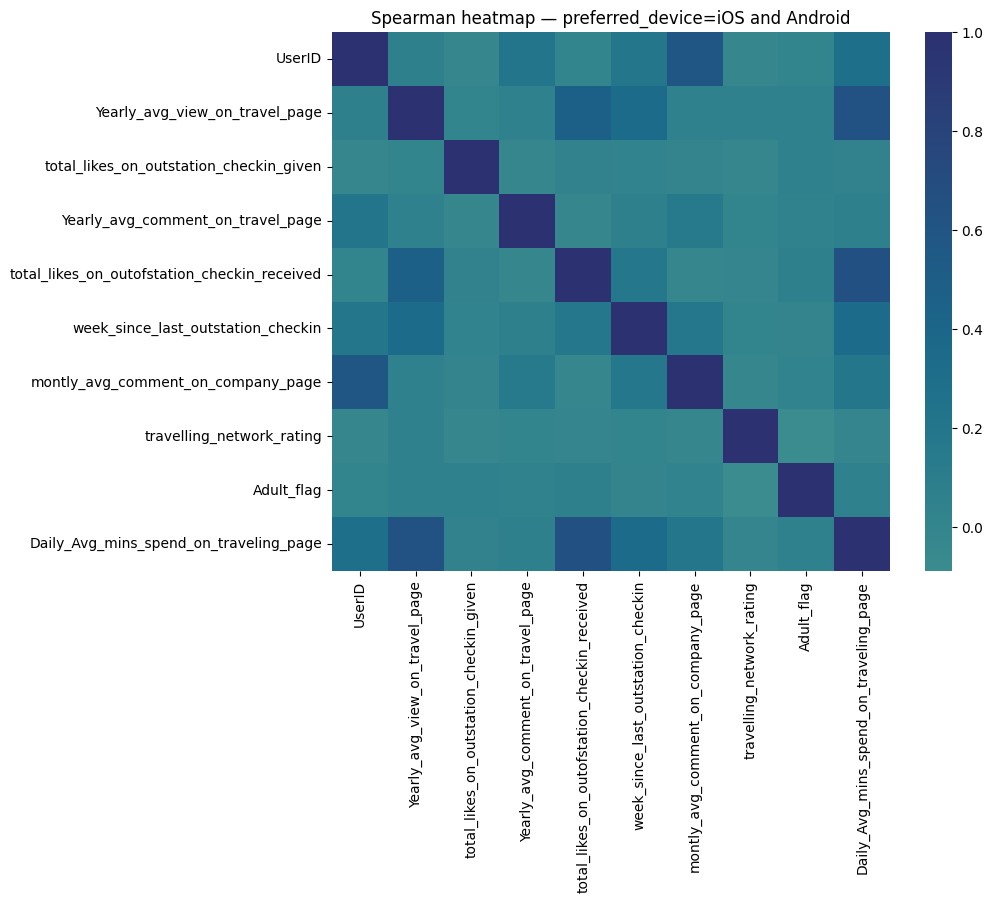

In [ ]:
pairwise_top_to_target(df, num_cols, target=target, top_k=6)
device_sliced_correlations(df, num_cols, device_col="preferred_device")


In [ ]:
# 2) Target mapping (Yes/No -> 1/0) into a new column to keep original intact
TARGET_ORIG = 'Taken_product'
TARGET_BIN = '_target'
df[TARGET_BIN] = df[TARGET_ORIG].map({'Yes':1, 'No':0}).astype('Int64')


Duplicate value check and treatment

In [ ]:
# Full-row duplicates
dupe_rows = df.duplicated()
print(f"Full duplicate rows: {dupe_rows.sum()}")

# If any, drop them
if dupe_rows.any():
    df = df[~dupe_rows].copy()
    print("Dropped full duplicate rows.")

# UserID-level duplicates (should be unique IDs)
if 'UserID' in df.columns:
    dupe_userid = df['UserID'].duplicated()
    print(f"Duplicate UserID count: {dupe_userid.sum()}")
    if dupe_userid.any():
        # Keep first occurrence; drop rest
        df = df[~dupe_userid].copy()
        print("Dropped duplicate UserID rows.")

df.shape


Full duplicate rows: 0
Duplicate UserID count: 0


(11760, 18)

Data cleaning (standardize categories, map flags)

In [ ]:
# 2a) Normalize device variants into {Laptop, Mobile, Other}
def normalize_device(x: str):
    if pd.isna(x): return np.nan
    s = str(x).strip().lower()
    # common mobile aliases
    mobile_tokens = ['android', 'ios', 'iphone', 'ipad', 'mobile', 'tab', 'android os', 'ios and android']
    if 'laptop' in s:
        return 'Laptop'
    if any(tok in s for tok in mobile_tokens):
        return 'Mobile'
    if s in ['other','others']:
        return 'Other'
    return 'Mobile' if s not in ['laptop','other'] else s.title()

if 'preferred_device' in df.columns:
    df['preferred_device'] = df['preferred_device'].apply(normalize_device)

# 2b) Normalize yes/no flags to 0/1
def yn_to_bin(s):
    if pd.isna(s): return np.nan
    s = str(s).strip().lower()
    if s in ['yes','y','true','1']: return 1
    if s in ['no','n','false','0']: return 0
    return np.nan

for col in ['following_company_page', 'working_flag', 'Adult_flag']:
    if col in df.columns:
        # If Adult_flag is numeric buckets already, skip mapping
        if col == 'Adult_flag' and pd.api.types.is_numeric_dtype(df[col]):
            continue
        df[col] = df[col].apply(yn_to_bin).astype('float')

# 2c) Standardize preferred_location_type minor typos (example merges)
if 'preferred_location_type' in df.columns:
    df['preferred_location_type'] = df['preferred_location_type'].astype('string').str.strip()
    df['preferred_location_type'] = df['preferred_location_type'].replace({
        'Tour  Travel': 'Tour and Travel',
        'Big City': 'Big Cities',
        'OTT Platform': 'OTT'
    })

print("Cleaning done.")
df[['preferred_device','following_company_page','working_flag','Adult_flag','preferred_location_type']].head(10)


Cleaning done.


,preferred_device,following_company_page,working_flag,Adult_flag,preferred_location_type
0,Mobile,1.0,0.0,0,Financial
1,Mobile,0.0,1.0,1,Financial
2,Mobile,1.0,0.0,0,Other
3,Mobile,1.0,0.0,0,Financial
4,Mobile,0.0,0.0,1,Medical
5,Mobile,0.0,0.0,0,Financial
6,Mobile,1.0,1.0,3,Medical
7,Mobile,0.0,1.0,1,Financial
8,Mobile,0.0,1.0,0,Financial
9,Mobile,0.0,0.0,2,<NA>


Anomalous value check and treatment

In [ ]:
import numpy as np
import pandas as pd

# Columns expected to be numeric & non-negative
nonneg_cols = [
    'Yearly_avg_view_on_travel_page',
    'total_likes_on_outstation_checkin_given',
    'yearly_avg_Outstation_checkins',
    'member_in_family',
    'Yearly_avg_comment_on_travel_page',
    'total_likes_on_outofstation_checkin_received',
    'week_since_last_outstation_checkin',
    'montly_avg_comment_on_company_page',
    'Daily_Avg_mins_spend_on_traveling_page'
]

# Columns that should be numeric within a range
rng_cols = {
    'travelling_network_rating': (1, 4)   # inclusive range [1,4]
}

# --- 3.0 Coerce mixed-type numeric-looking columns to numeric safely ---
def coerce_numeric_col(s: pd.Series) -> pd.Series:
    """
    Convert strings like '1,234', '  56 ', '—', 'NA' to numeric.
    Non-numeric becomes NaN.
    """
    if pd.api.types.is_numeric_dtype(s):
        return s
    # strip spaces, remove thousands separators and non-numeric symbols except . and -
    cleaned = (
        s.astype(str)
         .str.strip()
         .str.replace(',', '', regex=False)
         .str.replace(r'[^0-9\.\-]', '', regex=True)
    )
    # map empty strings to NaN
    cleaned = cleaned.replace({'': np.nan, '-': np.nan, '.': np.nan})
    return pd.to_numeric(cleaned, errors='coerce')

# Coerce all relevant columns that exist
for c in nonneg_cols + list(rng_cols.keys()):
    if c in df.columns:
        before_nonnum = (~pd.api.types.is_numeric_dtype(df[c])) or df[c].dtype == 'object'
        df[c] = coerce_numeric_col(df[c])
        after_nulls = df[c].isna().sum()
        if before_nonnum:
            print(f"[Type fix] Coerced '{c}' to numeric. NaNs after coercion: {after_nulls}")

# --- 3.1 Non-negativity checks: set negatives to NaN for later imputation ---
for c in nonneg_cols:
    if c in df.columns:
        neg_ct = df[c].lt(0).sum()
        if neg_ct > 0:
            df.loc[df[c] < 0, c] = np.nan
            print(f"[Anomaly] Replaced {neg_ct} negative values with NaN in '{c}'")

# --- 3.2 In-range checks (e.g., travelling_network_rating in [1,4]) ---
for c, (lo, hi) in rng_cols.items():
    if c in df.columns:
        out_ct = df[c].notna() & ~df[c].between(lo, hi)
        out_ct = int(out_ct.sum())
        if out_ct > 0:
            # clip to valid range
            df.loc[df[c].notna(), c] = df.loc[df[c].notna(), c].clip(lo, hi)
            print(f"[Anomaly] Clipped {out_ct} values of '{c}' to range [{lo}, {hi}]")

print("Anomaly checks completed successfully.")


[Type fix] Coerced 'Yearly_avg_view_on_travel_page' to numeric. NaNs after coercion: 581
[Type fix] Coerced 'total_likes_on_outstation_checkin_given' to numeric. NaNs after coercion: 381
[Type fix] Coerced 'yearly_avg_Outstation_checkins' to numeric. NaNs after coercion: 76
[Type fix] Coerced 'member_in_family' to numeric. NaNs after coercion: 15
[Type fix] Coerced 'Yearly_avg_comment_on_travel_page' to numeric. NaNs after coercion: 206
[Type fix] Coerced 'total_likes_on_outofstation_checkin_received' to numeric. NaNs after coercion: 0
[Type fix] Coerced 'week_since_last_outstation_checkin' to numeric. NaNs after coercion: 0
[Type fix] Coerced 'montly_avg_comment_on_company_page' to numeric. NaNs after coercion: 0
[Type fix] Coerced 'Daily_Avg_mins_spend_on_traveling_page' to numeric. NaNs after coercion: 0
[Type fix] Coerced 'travelling_network_rating' to numeric. NaNs after coercion: 0
Anomaly checks completed successfully.


Missing value check and treatment

In [ ]:
# Report missingness
miss_tbl = df.isna().sum().sort_values(ascending=False)
print(miss_tbl[miss_tbl>0])

# Strategy:
# - numeric: median impute
# - categorical: most frequent impute
# Create imputed copies to keep df readable
df_imp = df.copy()

num_cols_imp = df_imp.select_dtypes(include=[np.number]).columns.tolist()
cat_cols_imp = df_imp.select_dtypes(exclude=[np.number]).columns.tolist()

# Do not impute target here; it should have no missing ideally.
if TARGET_BIN in num_cols_imp: num_cols_imp.remove(TARGET_BIN)

# Numeric -> median
for c in num_cols_imp:
    if df_imp[c].isna().any():
        med = df_imp[c].median()
        df_imp[c] = df_imp[c].fillna(med)

# Categorical -> most frequent
for c in cat_cols_imp:
    if df_imp[c].isna().any():
        mode = df_imp[c].mode(dropna=True)
        fill_val = mode.iloc[0] if len(mode) else 'Unknown'
        df_imp[c] = df_imp[c].fillna(fill_val)

print("Imputation done.")
df_imp.isna().sum().sum()


Yearly_avg_view_on_travel_page             581
total_likes_on_outstation_checkin_given    381
Yearly_avg_comment_on_travel_page          206
following_company_page                     103
yearly_avg_Outstation_checkins              76
preferred_device                            53
preferred_location_type                     31
member_in_family                            15
dtype: int64
Imputation done.


np.int64(0)

Outlier check and treatment

In [ ]:
# Winsorize numeric columns at 1st/99th percentiles (robust to extreme tails)
df_cap = df_imp.copy()
cap_cols = [
    'Yearly_avg_view_on_travel_page',
    'total_likes_on_outstation_checkin_given',
    'yearly_avg_Outstation_checkins',
    'Yearly_avg_comment_on_travel_page',
    'total_likes_on_outofstation_checkin_received',
    'Daily_Avg_mins_spend_on_traveling_page'
]
for c in cap_cols:
    if c in df_cap.columns:
        lo, hi = df_cap[c].quantile([0.01, 0.99])
        df_cap[c] = df_cap[c].clip(lower=lo, upper=hi)

print("Outlier capping (1%/99%) applied where applicable.")


Outlier capping (1%/99%) applied where applicable.


Feature engineering (only non-leaky, simple & useful)

In [ ]:
df_fe = df_cap.copy()

# 6a) Engagement intensity proxies (safe)
if set(['Yearly_avg_view_on_travel_page','Daily_Avg_mins_spend_on_traveling_page']).issubset(df_fe.columns):
    df_fe['mins_per_view'] = np.where(df_fe['Yearly_avg_view_on_travel_page']>0,
                                      df_fe['Daily_Avg_mins_spend_on_traveling_page'] / df_fe['Yearly_avg_view_on_travel_page'],
                                      0)

# 6b) Social signal ratios (likes received vs given; avoid div by zero)
if set(['total_likes_on_outofstation_checkin_received','total_likes_on_outstation_checkin_given']).issubset(df_fe.columns):
    df_fe['like_receive_give_ratio'] = np.where(df_fe['total_likes_on_outstation_checkin_given']>0,
                                                df_fe['total_likes_on_outofstation_checkin_received'] / (df_fe['total_likes_on_outstation_checkin_given'] + 1e-9),
                                                df_fe['total_likes_on_outofstation_checkin_received'])

# 6c) Recency bucket from weeks since last check-in
if 'week_since_last_outstation_checkin' in df_fe.columns:
    df_fe['recency_bucket'] = pd.cut(
        df_fe['week_since_last_outstation_checkin'],
        bins=[-0.1, 4, 12, 24, 52, np.inf],
        labels=['≤1m','1–3m','3–6m','6–12m','>12m']
    )

# 6d) Map travelling_network_rating (1 high, 4 low) to “network_strength”
if 'travelling_network_rating' in df_fe.columns:
    df_fe['network_strength'] = df_fe['travelling_network_rating'].map({1:'High', 2:'MidHigh', 3:'MidLow', 4:'Low'})

print("Feature engineering done.")
df_fe.head()


Feature engineering done.


,UserID,Taken_product,Yearly_avg_view_on_travel_page,preferred_device,total_likes_on_outstation_checkin_given,yearly_avg_Outstation_checkins,member_in_family,preferred_location_type,Yearly_avg_comment_on_travel_page,total_likes_on_outofstation_checkin_received,...,montly_avg_comment_on_company_page,working_flag,travelling_network_rating,Adult_flag,Daily_Avg_mins_spend_on_traveling_page,_target,mins_per_view,like_receive_give_ratio,recency_bucket,network_strength
0,1000001,Yes,307.0,Mobile,38570.0,1.0,2.0,Financial,94.0,5993.0,...,11,0.0,1,0,8,1,0.026059,0.155380,1–3m,High
1,1000002,No,367.0,Mobile,9765.0,1.0,1.0,Financial,61.0,5130.0,...,23,1.0,4,1,10,0,0.027248,0.525346,≤1m,Low
2,1000003,Yes,277.0,Mobile,48055.0,1.0,2.0,Other,92.0,2090.0,...,15,0.0,2,0,7,1,0.025271,0.043492,1–3m,MidHigh
3,1000004,No,247.0,Mobile,48720.0,1.0,4.0,Financial,56.0,2909.0,...,11,0.0,3,0,8,0,0.032389,0.059709,≤1m,MidLow
4,1000005,No,202.0,Mobile,20685.0,1.0,1.0,Medical,40.0,3468.0,...,12,0.0,4,1,6,0,0.029703,0.167658,1–3m,Low


Class imbalance handling (strategy selection)

In [ ]:
# Report class balance & compute class weights to be used in baseline models
pos_rate = df_fe[TARGET_BIN].mean()
print(f"Positive rate: {pos_rate:.4f}   (1:{(1-pos_rate)/pos_rate:.2f} imbalance approx.)")

# sklearn class_weight
classes = np.array([0,1])
weights = compute_class_weight(class_weight='balanced', classes=classes, y=df_fe[TARGET_BIN].astype(int))
class_weights = {0: weights[0], 1: weights[1]}
print("Recommended class_weight for models:", class_weights)



Positive rate: 0.1612   (1:5.20 imbalance approx.)
Recommended class_weight for models: {0: np.float64(0.5961070559610706), 1: np.float64(3.1012658227848102)}


Feature scaling (numeric only; handled in ColumnTransformer)

In [ ]:
# We'll define numeric/categorical lists now (post FE)
y = df_fe[TARGET_BIN].astype(int).values

id_cols = ['UserID']
drop_cols = [TARGET_ORIG, TARGET_BIN] + id_cols  # drop from features

X_all = df_fe.drop(columns=[c for c in drop_cols if c in df_fe.columns]).copy()

# Identify numeric and categorical after FE
num_features = X_all.select_dtypes(include=[np.number]).columns.tolist()
cat_features = X_all.select_dtypes(exclude=[np.number]).columns.tolist()

print("Numeric features:", num_features)
print("Categorical features:", cat_features)

# Build a preprocessing transformer (scaler for numeric, one-hot for categorical)
numeric_transformer = StandardScaler(with_mean=True, with_std=True)
categorical_transformer = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

preprocess = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num_features),
        ('cat', categorical_transformer, cat_features)
    ],
    remainder='drop'
)

print("Preprocessing transformer ready (no fitting yet).")


Numeric features: ['Yearly_avg_view_on_travel_page', 'total_likes_on_outstation_checkin_given', 'yearly_avg_Outstation_checkins', 'member_in_family', 'Yearly_avg_comment_on_travel_page', 'total_likes_on_outofstation_checkin_received', 'week_since_last_outstation_checkin', 'following_company_page', 'montly_avg_comment_on_company_page', 'working_flag', 'travelling_network_rating', 'Adult_flag', 'Daily_Avg_mins_spend_on_traveling_page', 'mins_per_view', 'like_receive_give_ratio']
Categorical features: ['preferred_device', 'preferred_location_type', 'recency_bucket', 'network_strength']
Preprocessing transformer ready (no fitting yet).


Data preparation for modeling (device split + train/valid splits)

In [ ]:
# Split by device for two separate models as per project requirement
device_col = 'preferred_device'
if device_col not in df_fe.columns:
    raise ValueError("preferred_device not found after cleaning. Please ensure previous cells ran correctly.")

def make_device_subset(df_in, device_value):
    sub = df_in[df_in[device_col] == device_value].copy()
    # features/target
    X = sub.drop(columns=[c for c in drop_cols if c in sub.columns]).copy()
    y = sub[TARGET_BIN].astype(int).values
    # columns by type
    num_f = X.select_dtypes(include=[np.number]).columns.tolist()
    cat_f = X.select_dtypes(exclude=[np.number]).columns.tolist()
    return sub, X, y, num_f, cat_f

# Laptop subset
lap_df, lap_X, lap_y, lap_num_f, lap_cat_f = make_device_subset(df_fe, 'Laptop')
# Mobile subset (everything not Laptop; we normalized earlier)
mob_df, mob_X, mob_y, mob_num_f, mob_cat_f = make_device_subset(df_fe, 'Mobile')

print("Laptop subset:", lap_df.shape, "   Mobile subset:", mob_df.shape)

# Train/valid splits (stratified)
lap_X_train, lap_X_valid, lap_y_train, lap_y_valid = train_test_split(
    lap_X, lap_y, test_size=0.2, random_state=42, stratify=lap_y
)
mob_X_train, mob_X_valid, mob_y_train, mob_y_valid = train_test_split(
    mob_X, mob_y, test_size=0.2, random_state=42, stratify=mob_y
)

print("Laptop split:", lap_X_train.shape, lap_X_valid.shape)
print("Mobile split:", mob_X_train.shape, mob_X_valid.shape)

# Build preprocessors per device (so each uses feature lists from its subset)
lap_preprocess = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), lap_num_f),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), lap_cat_f)
    ],
    remainder='drop'
)
mob_preprocess = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), mob_num_f),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), mob_cat_f)
    ],
    remainder='drop'
)

print("Per-device preprocessors constructed (fit later inside modeling pipelines).")


Laptop subset: (1108, 22)    Mobile subset: (10648, 22)
Laptop split: (886, 19) (222, 19)
Mobile split: (8518, 19) (2130, 19)
Per-device preprocessors constructed (fit later inside modeling pipelines).


Data leakage handling (checks + best practices)

In [ ]:
# 1) Ensure target/ID columns are not present in features
bad_in_lap = set(drop_cols).intersection(lap_X_train.columns)
bad_in_mob = set(drop_cols).intersection(mob_X_train.columns)
print("Leakage check (Laptop):", bad_in_lap)
print("Leakage check (Mobile):", bad_in_mob)

# 2) Ensure all preprocessing is fit on TRAIN ONLY (we will fit ColumnTransformer inside Pipeline on train)
#    This cell is a reminder and guard—actual fitting happens during model building.
# 3) Ensure engineered features don't use future information (all FE is from static behavior columns — OK)
# 4) No per-row aggregation over the whole dataset was used to create features — OK

print("Leakage safeguards in place. Ready for baseline modeling next.")


Leakage check (Laptop): set()
Leakage check (Mobile): set()
Leakage safeguards in place. Ready for baseline modeling next.


Modele Building


In [ ]:
try:
    df_model = df_fe.copy()
    TARGET_BIN
    TARGET_ORIG
except NameError:
    # Minimal rebuild (uses your Drive path)
    df_raw = pd.read_excel('/content/drive/MyDrive/flight_customer_data.xlsx')
    df_raw.columns = df_raw.columns.str.strip()
    TARGET_ORIG = 'Taken_product'
    TARGET_BIN = '_target'
    df_raw[TARGET_BIN] = df_raw[TARGET_ORIG].map({'Yes':1,'No':0}).astype('Int64')

    # simple cleaning to make device workable
    def normalize_device(x):
        if pd.isna(x): return np.nan
        s = str(x).strip().lower()
        if 'laptop' in s: return 'Laptop'
        if any(tok in s for tok in ['android','ios','iphone','ipad','mobile','tab']): return 'Mobile'
        if s in ['other','others']: return 'Other'
        return 'Mobile'
    if 'preferred_device' in df_raw.columns:
        df_raw['preferred_device'] = df_raw['preferred_device'].apply(normalize_device)

    # simple imputation
    df_model = df_raw.copy()
    for c in df_model.select_dtypes(include=[np.number]).columns:
        if c != TARGET_BIN: df_model[c] = pd.to_numeric(df_model[c], errors='coerce').fillna(df_model[c].median())
    for c in df_model.select_dtypes(exclude=[np.number]).columns:
        df_model[c] = df_model[c].fillna(df_model[c].mode(dropna=True).iloc[0] if df_model[c].mode().size else 'Unknown')

# Set device column
device_col = 'preferred_device'
assert device_col in df_model.columns, "preferred_device not found; ensure preprocessing ran."

# Utility to build per-device splits + preprocessors
def make_device_data(df_in, device_value, target_col=TARGET_BIN, id_cols=('UserID', TARGET_ORIG)):
    sub = df_in[df_in[device_col] == device_value].copy()
    X = sub.drop(columns=[c for c in id_cols if c in sub.columns] + [target_col])
    y = sub[target_col].astype(int).values

    num_f = X.select_dtypes(include=[np.number]).columns.tolist()
    cat_f = X.select_dtypes(exclude=[np.number]).columns.tolist()

    pre = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), num_f),
            ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), cat_f)
        ],
        remainder='drop'
    )

    X_train, X_valid, y_train, y_valid = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    return (X_train, X_valid, y_train, y_valid, pre, num_f, cat_f, sub.shape)

# Build Laptop & Mobile datasets
lap = make_device_data(df_model, 'Laptop')
mob = make_device_data(df_model, 'Mobile')

print("Laptop shape:", lap[-1], "Mobile shape:", mob[-1])

Laptop shape: (1108, 22) Mobile shape: (10648, 22)


Evaluation helpers (multi-metric, plus top-K targeting)

In [ ]:
def evaluate_scores(y_true, y_proba, threshold=0.5, top_k=0.10, label=""):
    """Compute a rich set of metrics + show ROC/PR plots.
       Compatible with sklearn versions that removed 'eps' from log_loss.
    """
    y_proba = np.asarray(y_proba, dtype=float)
    # clip to avoid log(0) issues
    y_proba_clipped = np.clip(y_proba, 1e-15, 1 - 1e-15)

    # Primary metrics
    roc = roc_auc_score(y_true, y_proba_clipped)
    prauc = average_precision_score(y_true, y_proba_clipped)
    ll = log_loss(y_true, y_proba_clipped)  # no eps kwarg

    # Thresholded metrics
    y_pred = (y_proba_clipped >= threshold).astype(int)
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    cm = confusion_matrix(y_true, y_pred)

    # Top-K targeting metrics
    k = int(np.ceil(len(y_true) * top_k))
    order = np.argsort(-y_proba_clipped)
    top_idx = order[:k]
    prec_at_k = y_true[top_idx].mean() if k > 0 else np.nan
    base_rate = y_true.mean() if len(y_true) else np.nan
    lift_at_k = (prec_at_k / base_rate) if base_rate and base_rate > 0 else np.nan
    rec_at_k = y_true[top_idx].sum() / y_true.sum() if y_true.sum() > 0 else np.nan

    # Curves
    RocCurveDisplay.from_predictions(y_true, y_proba_clipped, name=f"ROC — {label}")
    plt.show()
    PrecisionRecallDisplay.from_predictions(y_true, y_proba_clipped, name=f"PR — {label}")
    plt.show()

    # Print metrics
    print(f"=== {label} ===")
    print(f"ROC-AUC: {roc:.4f}")
    print(f"PR-AUC:  {prauc:.4f}")
    print(f"LogLoss: {ll:.4f}")
    print(f"Accuracy@{threshold:.2f}: {acc:.4f}")
    print(f"Precision@{threshold:.2f}: {prec:.4f}")
    print(f"Recall@{threshold:.2f}:    {rec:.4f}")
    print(f"F1@{threshold:.2f}:        {f1:.4f}")
    print("Confusion matrix @threshold:\n", cm)
    print(f"Precision@Top{int(top_k*100)}%: {prec_at_k:.4f}")
    print(f"Lift@Top{int(top_k*100)}%:      {lift_at_k:.2f}x")
    print(f"Recall@Top{int(top_k*100)}%:    {rec_at_k:.4f}")

    return {
        "roc_auc": roc, "pr_auc": prauc, "logloss": ll,
        "acc": acc, "prec": prec, "rec": rec, "f1": f1,
        "prec_at_k": prec_at_k, "lift_at_k": lift_at_k, "recall_at_k": rec_at_k,
        "cm": cm
    }

Baseline Logistic Regression (Laptop)

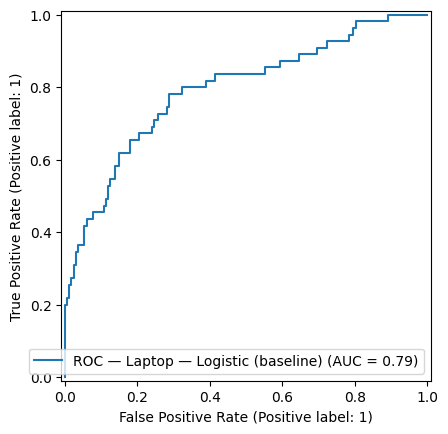

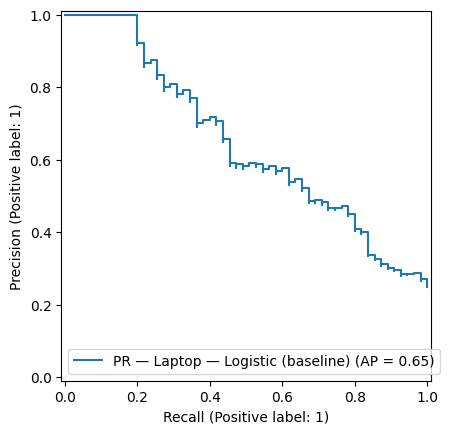

=== Laptop — Logistic (baseline) ===
ROC-AUC: 0.7923
PR-AUC:  0.6475
LogLoss: 0.5403
Accuracy@0.50: 0.7387
Precision@0.50: 0.4815
Recall@0.50:    0.7091
F1@0.50:        0.5735
Confusion matrix @threshold:
 [[125  42]
 [ 16  39]]
Precision@Top10%: 0.7826
Lift@Top10%:      3.16x
Recall@Top10%:    0.3273


In [ ]:
X_train, X_valid, y_train, y_valid, pre_lap, lap_num_f, lap_cat_f, _ = lap

# class_weight='balanced' for imbalance
lr_lap = Pipeline(steps=[
    ('prep', pre_lap),
    ('clf', LogisticRegression(max_iter=200, class_weight='balanced', solver='liblinear'))
])

lr_lap.fit(X_train, y_train)
proba_lap = lr_lap.predict_proba(X_valid)[:,1]

metrics_lap = evaluate_scores(y_valid, proba_lap, threshold=0.50, top_k=0.10, label="Laptop — Logistic (baseline)")


Baseline Logistic Regression (Mobile)

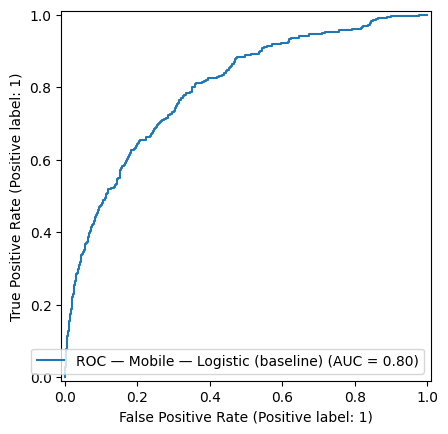

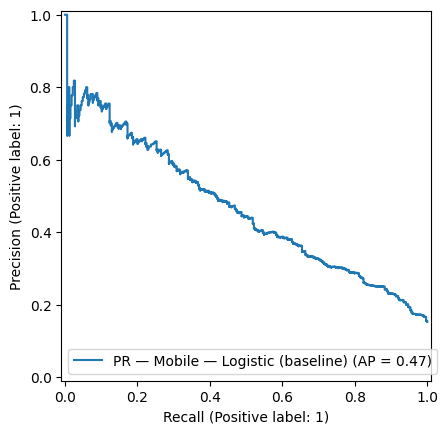

=== Mobile — Logistic (baseline) ===
ROC-AUC: 0.7981
PR-AUC:  0.4654
LogLoss: 0.5615
Accuracy@0.50: 0.7014
Precision@0.50: 0.3040
Recall@0.50:    0.7469
F1@0.50:        0.4321
Confusion matrix @threshold:
 [[1252  554]
 [  82  242]]
Precision@Top10%: 0.5399
Lift@Top10%:      3.55x
Recall@Top10%:    0.3549


In [ ]:
X_train, X_valid, y_train, y_valid, pre_mob, mob_num_f, mob_cat_f, _ = mob

lr_mob = Pipeline(steps=[
    ('prep', pre_mob),
    ('clf', LogisticRegression(max_iter=200, class_weight='balanced', solver='liblinear'))
])

lr_mob.fit(X_train, y_train)
proba_mob = lr_mob.predict_proba(X_valid)[:,1]

metrics_mob = evaluate_scores(y_valid, proba_mob, threshold=0.50, top_k=0.10, label="Mobile — Logistic (baseline)")


Compact comparison table

In [ ]:
def row_from_metrics(name, m):
    return {
        "model": name,
        "roc_auc": m["roc_auc"],
        "pr_auc": m["pr_auc"],
        "logloss": m["logloss"],
        "acc@0.5": m["acc"],
        "prec@0.5": m["prec"],
        "rec@0.5": m["rec"],
        "f1@0.5": m["f1"],
        "prec@top10%": m["prec_at_k"],
        "lift@top10%": m["lift_at_k"],
        "recall@top10%": m["recall_at_k"]
    }

comp = pd.DataFrame([
    row_from_metrics("Laptop — Logistic", metrics_lap),
    row_from_metrics("Mobile — Logistic", metrics_mob)
]).round(4)

comp


,model,roc_auc,pr_auc,logloss,acc@0.5,prec@0.5,rec@0.5,f1@0.5,prec@top10%,lift@top10%,recall@top10%
0,Laptop — Logistic,0.7923,0.6475,0.5403,0.7387,0.4815,0.7091,0.5735,0.7826,3.1589,0.3273
1,Mobile — Logistic,0.7981,0.4654,0.5615,0.7014,0.3040,0.7469,0.4321,0.5399,3.5494,0.3549
